In [ ]:
!pip install -q tensorflow-text

In [ ]:
import os
import time
import shutil

import pandas as pd
import sqlite3
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re
from tqdm import tqdm
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.layers import StringLookup
from tensorflow.keras.layers import GRU, Dense, LSTM, Input, Embedding
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from nltk.translate.bleu_score import sentence_bleu
from tensorflow.keras.layers import TextVectorization
import tensorflow_text as tf_text

import re
import collections
import warnings
warnings.filterwarnings('ignore')
%load_ext tensorboard

pd.set_option('display.max_colwidth',1024)
pd.set_option('display.width',1024)

drive_path = '/content/drive/MyDrive/01_Applied_AI_Course_New/CaseStudies/Text Creation/'

# Data Processing Utils
1. Text Standardization - removes html, punctuations & unicode chars
2. Construct the vocabulary using the raw data
3. Tokenization of raw data for constructing the vocabulary
4. Generate input & target sequences 
5. Splitup the data into train & test datasets
6. Read the vocabulary file from saved path


In [ ]:
HTML = re.compile('<.*?>')
# initializing punctuations string
PUNCT = '''!()-[]{};:"\<>/?@#$%^&*_~'''

# converts to lower case, remove non-asci chars and html tags
def text_standardization(text):
  text = text.lower()
  text = re.sub(HTML, ' ', text)
  text = ''.join([i if ord(i) < 128 else ' ' for i in text])
  for ele in text:
    if ele in PUNCT:
        text = text.replace(ele, "")
  return text

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

def configure_dataset(dataset):
  return dataset.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
## https://www.tensorflow.org/tutorials/load_data/text

from collections import Counter

def construct_vocab(dataset_name, tokenized_ds, max_tokens, seq_len, with_tfidf):
 
  tokenized_ds = configure_dataset(tokenized_ds)
  
  vocab_dict = collections.defaultdict(lambda: 0)
  for toks in tqdm(tokenized_ds.as_numpy_iterator()):
    for tok in toks:
      vocab_dict[tok] += 1
  vocab = sorted(vocab_dict.items(), key=lambda x: x[1], reverse=True)

  if with_tfidf:
    N = len(tokenized_ds)
    tfidf_vocab_dict = {tok: np.log(N/val+1) for tok, val in vocab_dict.items()}
    vocab = sorted(tfidf_vocab_dict.items(), key=lambda x: x[1], reverse=True)
  
  full_vocab = [token for token, count in vocab]  
  vocab = vocab[:max_tokens-2]
  vocab = [token for token, count in vocab]
  vocab.append(tf.constant('UNK').numpy()) # to assign last token number for all outlier/unknown keys 
  
  # save full vocab for further process
  pd.to_pickle(full_vocab, drive_path+f'{dataset_name}_full_vocab.pkl')

  # save vocab for further process
  pd.to_pickle(vocab, drive_path+f'{dataset_name}_vocab.pkl')
  
  print("Full Vocab size: ", len(full_vocab))
  print("Filterd Vocab size: ", len(vocab))

  return vocab

In [ ]:
# tokenization of raw data to construct the vocabulary 
def get_data_and_vocab_table(dataset_name, data_tokenizer, text_values, max_tokens, seq_len=80, with_tfidf=False):
  
  # merge all contents to form single text
  text =  ' '.join(text_values).split() # longform_text_data.longform_text.values)

  # split up the text using char limit
  data = [' '.join(text[idx:idx+seq_len+1]) for idx in tqdm(range(0, len(text), seq_len+1))]
  print('\nText split sequence - completed\n')

  # convert the list to tf dataset
  dataset = tf.data.Dataset.from_tensor_slices(data)

  # tokenize the data
  tokenized_ds = dataset.map(lambda text: data_tokenizer.tokenize(text))
  print('\nTokenization - completed\n')

  # construct vocab
  vocab = construct_vocab(dataset_name, tokenized_ds, max_tokens, seq_len, with_tfidf)
  print('\nConstruction of Vocab - completed\n')

  # construct vocab_table
  keys = vocab
  values = range(1, len(vocab) + 1)

  init = tf.lookup.KeyValueTensorInitializer(
    keys, values, key_dtype=tf.string, value_dtype=tf.int64)

  num_oov_buckets = 1
  vocab_table = tf.lookup.StaticVocabularyTable(init, num_oov_buckets)

  return data, vocab_table, vocab_table.size().numpy()


In [ ]:
# generate input & target sequences 
def generate_input_target_sequences(sequence):
    input_text = sequence[:-1]
    target_text = sequence[1:]
    return input_text, target_text

In [ ]:
# splitup the data into train & test datasets
def splitup_train_test(data, data_tokenizer, vocab_table, batch_size, buffer_size, test_size=0.2):
  
  # train test split
  train_text, test_text = train_test_split(data, test_size=test_size, random_state=42)

  # converting text into tensor format
  train_data = tf.data.Dataset.from_tensor_slices(train_text)
  test_data = tf.data.Dataset.from_tensor_slices(test_text)

  # tokenization of tensor data
  train_ds = train_data.map(lambda text: data_tokenizer.tokenize(text))
  test_ds = test_data.map(lambda text: data_tokenizer.tokenize(text))

  # converting to sequence using constructed vocab
  train_seq = train_ds.map(lambda tok: vocab_table.lookup(tok))
  test_seq = test_ds.map(lambda tok: vocab_table.lookup(tok))

  # generating input & target sequences
  train_dataset = train_seq.map(generate_input_target_sequences)
  test_dataset = test_seq.map(generate_input_target_sequences)

  # batching the sequences
  train_dataset = train_dataset.shuffle(buffer_size).padded_batch(batch_size, drop_remainder=True)
  test_dataset = test_dataset.padded_batch(batch_size, drop_remainder=True)

  return configure_dataset(train_dataset), configure_dataset(test_dataset)


In [ ]:
# read the vocab from saved path
def get_vocab(dataset_name, vocab_table):
  vocab = pd.read_pickle(drive_path+f'{dataset_name}_vocab.pkl')
  vocab_dict = {key.decode('utf-8'):val for (key, val) in zip(vocab, vocab_table[tf.constant(vocab)].numpy())}
  return vocab_dict


# Inference & Validation Utils
1. Predict one step/sentence based on the model type
2. Predictions of sample batch along with BLEU (1-4) scores based on model type
3. Beam Search util
4. Generate token ids for sample input
5. Greedy Search util
6. Generate text for next set of words using sample input text


In [ ]:
# predict one step/sentence based on the model type
def predict_one_step(model, input, model_type, h_states, c_states):

  if model_type == 'attention':
    embd_layer = model.layers[1](input)
    predicted_logits = model.layers[3](embd_layer)
    predicted_logits = predicted_logits.numpy().reshape(1, predicted_logits.numpy().shape[0], predicted_logits.numpy().shape[1])
    return predicted_logits

  elif model_type == 'lstm':
    embd_layer = model.layers[0](input)
    embd_layer = embd_layer.numpy().reshape(1, embd_layer.numpy().shape[0], embd_layer.numpy().shape[1])
    if (h_states is None) & (c_states is None):
        h_states, c_states = model.layers[1].get_initial_state(embd_layer)
    lstm_out, h_states, c_states = model.layers[1](embd_layer, initial_state=[h_states, c_states])
    predicted_logits = model.layers[2](lstm_out)
    return predicted_logits, h_states, c_states
    
  elif model_type == 'gru':
    embd_layer = model.layers[0](input)
    embd_layer = embd_layer.numpy().reshape(1, embd_layer.numpy().shape[0], embd_layer.numpy().shape[1])
    if h_states is None:
        h_states = model.layers[1].get_initial_state(embd_layer)
    gru_out, h_states = model.layers[1](embd_layer, initial_state=h_states)
    predicted_logits = model.layers[2](gru_out)
    return predicted_logits, h_states


In [ ]:
##https://machinelearningmastery.com/beam-search-decoder-natural-language-processing/

# beam search
def beam_search_decoder(data, k):
	sequences = [[list(), 0.0]]
	# walk over each step in sequence
	for row in data:
		all_candidates = list()
		# expand each current candidate
		for i in range(len(sequences)):
			seq, score = sequences[i]
			for j in range(len(row)):
				candidate = [seq + [j], score - row[j]]
				all_candidates.append(candidate)
		# order all candidates by score
		ordered = sorted(all_candidates, key=lambda tup:tup[1])
		# select k best
		sequences = ordered[:k]
	return sequences


In [ ]:
# generate token ids for sample input 
def get_input_ids(sample_input, word_lookup):
  input = np.zeros(80, dtype=np.int64)
  for idx, w in enumerate(sample_input):
    input[idx]=word_lookup.get(w,1)
  return tf.convert_to_tensor(input)

In [ ]:
# Get the top preicted index based on logits
def greedy_seach(predicted_logits, id_lookup):
  logits, indices = tf.math.top_k(predicted_logits, k=10, sorted=True)
  indices = np.asarray(indices).astype("int32")
  preds = tf.keras.activations.softmax(tf.expand_dims(logits, 0))[0]
  preds = np.asarray(preds).astype("float32")
  return np.random.choice(indices, p=preds)

In [ ]:
## https://keras.io/examples/generative/text_generation_with_miniature_gpt/

def gnerate_next_word(model, model_type, inputs, result, word_lookup, id_lookup, h_states=None, c_states=None, beam=False):

  sample_index = len(result)-1
  if beam:
    # Convert strings to token IDs.
    #result = ' '.join(result)
    #beam_inputs = ' '.join([result if using_previous_words is None else result[-using_previous_words:]])
    input_ids = get_input_ids(result, word_lookup)

    if model_type=='lstm':
      # lstm will have both states hidden and cell
      predicted_logits, h_states, c_states = predict_one_step(model, input_ids, model_type, h_states, c_states)
    
    elif model_type=='gru':
      # gru will have only hidden state
      predicted_logits, h_states = predict_one_step(model, input_ids, model_type, h_states, c_states)
    
    elif model_type=='attention':
      # Attn model
      predicted_logits = predict_one_step(model, input_ids, model_type, h_states, c_states)

    # pick the highest log likelihood ratio among top 3 proposals
    predicted_ids = beam_search_decoder(predicted_logits[:,sample_index,:], 3)
    predicted_ids = predicted_ids[-1][0][0]
  
  else:
    
    # Convert strings to token IDs.
    input_ids = get_input_ids(result, word_lookup)
    
    if model_type=='lstm':
      # lstm will have both states hidden and cell
      predicted_logits, h_states, c_states = predict_one_step(model, input_ids, model_type, h_states, c_states)
    
    elif model_type=='gru':
      # gru will have only hidden state
      predicted_logits, h_states = predict_one_step(model, input_ids, model_type, h_states, c_states)
    
    elif model_type=='attention':
      # Attn model
      predicted_logits = predict_one_step(model, input_ids, model_type, h_states, c_states)

    # Convert from token ids to characters
    predicted_ids = greedy_seach(predicted_logits[0][sample_index], id_lookup)
  
  predicted_word = id_lookup[predicted_ids]

  # Return the word and model state.
  if model_type=='lstm':
    return [predicted_word], h_states, c_states
  elif model_type=='gru':
    return [predicted_word], h_states
  elif model_type=='attention':
    return [predicted_word]

In [ ]:
# generate text for next set of words using sample input text 
def generate_text(model, vocab_table, dataset_name, model_type, sample_input_text, predict_next_words=50, with_beam=False):
  start = time.time()
  
  # load longform_id_lookup
  word_lookup = get_vocab(dataset_name, vocab_table)
  id_lookup = {val: key for key, val in word_lookup.items()}

  h_states, c_states = None, None
  next_word = [sample_input_text]
  result = [sample_input_text]

  if model_type=='lstm':
    # lstm model text generation
    for n in tqdm(range(predict_next_words)):
      next_word, h_states, c_states = gnerate_next_word(model, model_type, next_word, result, word_lookup, id_lookup, h_states=h_states, c_states=c_states, beam=with_beam)
      result.extend(next_word)
  elif model_type=='gru':
    # gru model text generation
    for n in tqdm(range(predict_next_words)):
      next_word, h_states = gnerate_next_word(model, model_type, result, next_word, word_lookup, id_lookup, h_states=h_states, beam=with_beam)
      result.extend(next_word)
  elif model_type=='attention':
    # gru model text generation
    for n in tqdm(range(predict_next_words)):
      next_word = gnerate_next_word(model, model_type, result, next_word, word_lookup, id_lookup, h_states=h_states, beam=with_beam)
      result.extend(next_word)

  result = ' '.join([_ for _ in result if _!='UNK'])
  end = time.time()
  print(f'\nRun time:, {end - start}\n')
  return result

# Word Level Models

## Word RNN

LSTM - Architecture

    position_embeeding(embed dim - 256) ----> LSTM (512 units) -> Dense (vocab_size)

GRU - Architecture

    position_embeeding(embed dim - 256) ----> GRU (512 units) -> Dense (vocab_size)

In [ ]:
## https://keras.io/examples/generative/text_generation_with_miniature_gpt/

## Create two seperate embedding layers: one for tokens and one for token index (positions).

class TokenAndPositionEmbedding(tf.keras.layers.Layer):
    def __init__(self, maxlen, vocab_size, embed_dim):
        super(TokenAndPositionEmbedding, self).__init__()
        self.token_emb = Embedding(input_dim=vocab_size, output_dim=embed_dim)
        self.pos_emb = Embedding(input_dim=maxlen, output_dim=embed_dim)

    def call(self, x):
        maxlen = tf.shape(x)[-1]
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        x = self.token_emb(x)
        return x + positions

In [ ]:
## https://www.tensorflow.org/text/tutorials/text_generation

class WordRNN(tf.keras.Model):
  def __init__(self, vocab_size, embedding_dim, maxlen, dropout, rnn_units, kernel_reg=None, use_lstm=False):
    super().__init__(self)
    self.embedding_layer = TokenAndPositionEmbedding(maxlen, vocab_size, embed_dim)
    #self.embedding = TokenAndPositionEmbedding(maxlen, vocab_size, embedding_dim) 
    #tf.keras.layers.Embedding(vocab_size+1, embedding_dim)#, weights=[embedding_word_matrix])

    if use_lstm:
      # LSTM layer initialisation
      self.lstm = tf.keras.layers.LSTM(rnn_units, dropout=dropout,
                                    return_sequences=True,
                                    return_state=True)
    else:
      # GRU layer initialisation
      self.gru = tf.keras.layers.GRU(rnn_units, dropout=dropout,
                                    return_sequences=True,
                                    return_state=True)
    
    self.dense = tf.keras.layers.Dense(vocab_size, kernel_regularizer=kernel_reg)
    self.use_lstm = use_lstm

  def call(self, inputs, h_states=None, c_states=None, return_state=False, training=False):
    x = inputs
    x = self.embedding_layer(x, training=training)
    
    # LSTM layer call parameters with both states hidden and cell
    if self.use_lstm:
      if (h_states is None) & (c_states is None):
        h_states, c_states = self.lstm.get_initial_state(x)
      x, h_states, c_states = self.lstm(x, initial_state=[h_states, c_states], training=training)

    else:

      # GRU layer call parameters with hidden state
      if h_states is None:
        h_states = self.gru.get_initial_state(x)
      x, states = self.gru(x, initial_state=h_states, training=training)
    x = self.dense(x, training=training)
    
    if return_state:
      if self.use_lstm:
        return x, h_states, c_states
      else:
        return x, h_states
    else:
      return x

# Data Centric - Debugging

Followed below process to debug the model and to understand the data behavior
1. Data processing with WhitespaceTokenizer
2. Predictions with BLEU(1-4) Scores
3. Compute BLEU(1-4) Scores
4. Plotting BLEU Scores (PDF, CDF, BoxPlot)
5. Creating Supporting Features to understand data behavior of trained model
6. Generate Word Cloud Plotting, to understand data behavior visually


## Data Load

In [ ]:
# load the scifi text data
scifi_data = pd.read_pickle(drive_path+'scifi_data.pkl')
scifi_text_data = pd.DataFrame({'scifi_text': scifi_data})
print(scifi_text_data.shape)
scifi_text_data.head()

(145827, 1)


,scifi_text
0,"MARCH # All Stories New and Complete Publisher Editor IF is published bi-monthly by Quinn Publishing Company, Inc., Kingston, New York. Volume #, No. #. Copyright # by Quinn Publishing Company, Inc. Application for Entry' as Second Class matter at Post Office, Buffalo, New York, pending. Subscription # for # issues in U.S. and Possessions: Canada # for # issues; elsewhere #. Aiiow four weeks for change of address. All stories appearing in this magazine are fiction. Any similarity to actual persons is coincidental. #c a fcopy. Printed ia U.S. A. A chat with the editor i # science fiction magazine called IF. The title was selected after much thought because of its brevity and on the theory it is indicative of the field and will be easy to remember. The tentative title that just morning and couldn't remember it until we'd had a cup of coffee, it was summarily discarded. A great deal of thought and effort lias gone into the formation of this magazine. We have had the aid of several very talented and generou..."
1,"for which we are most grateful. Much is due them for their warmhearted assistance. And now that the bulk of the formative work is done, we will try to maintain IF as one of the finest books on the market. t a great public demand for our magazine. In short, why will you buy IF? We cannot, in honesty, say we will publish at all times the best science fiction in the field. That would not be true. But we will have access to the best stories, and we will get our fair share of works from the best writers. We definitely will not talk ""adult"" or ""juvenile"" relative to our content as we feel such terms are misleading. We would rather think at all times in the terms of ""story"". Some of the greatest escapist literature ever written, Treasure Island for instance, could be put into either category or both. And if Edgar Rice Burroughs is juvenile, then so are we, because the late master has given us some memorable thrills. Frankly, we don't think you'll buy IF because you feel we print better yams than any other mag."
2,"You will buy it, we hope, because you like its personality. Every magazine, we feel, does have a definite personality of its own. This personality is usually a reflection of the editors, their way of thinking, their appreciation of tKe market, their interpretation of what you will like best in stories and artwork. We have tried to make IF different from any other science fiction magazine on the stands while still building it along the lines of what every science fiction mag must be. Aside from the letter columns and the editorial, which are departments of field-wide use, we have not copied any feature of any other magazine. We will not, for instance, review fanzines, because we feel that is being most ably done by other mags. Nor will we, as a general practice, review books because that appears to us to be overdone. a personality of our own and hope thereby to establish an affinity with a large number of readers who will remember IF when they buy a science fiction mag as one they like and wish to continue..."
3,"At all times we will hew to the story-line and will exhort with our writers to do the same. As an example, when Howard Browne phoned to talk over the plot for his lead novel in this issue, he described what ivas without doubt a staggering premise, a really startling concept. ""But,"" he mourned, S T suppose I'll have to bend it around to give them the good old conventional ending."" We told Howard, ""Not for IF, chum. Remember the old creed we live by. A writer may cheat on his wife, but he is ever true to the story-line. He may haul his infant son around by one leg. but he carries a good story-idea like a holy relic. If there is only one logical ending for Twelve Times ZerG, that's the ending we want."" Therefore, we do not feel the majority of readers necessarily want a happy ending regardless of all else. Not when it is incompatable with the aura of realism created by the writer. A chec

In [ ]:
# convert scifi_text_data to lower case & remove non-asci char
%%time
scifi_text_data['scifi_text'] = scifi_text_data.scifi_text.apply(lambda x: text_standardization(x))
print(scifi_text_data['scifi_text'].head())
print(' ')

0            march  all stories new and complete publisher editor if is published bimonthly by quinn publishing company, inc., kingston, new york. volume , no. . copyright  by quinn publishing company, inc. application for entry' as second class matter at post office, buffalo, new york, pending. subscription  for  issues in u.s. and possessions canada  for  issues elsewhere . aiiow four weeks for change of address. all stories appearing in this magazine are fiction. any similarity to actual persons is coincidental. c a fcopy. printed ia u.s. a. a chat with the editor  i   science fiction magazine called if. the title was selected after much thought because of its brevity and on the theory it is indicative of the field and will be easy to remember. the tentative title that just morning and couldn't remember it until we'd had a cup of coffee, it was summarily discarded. a great deal of thought and effort lias gone into the formation of this magazine. we have had the aid of several very t

In [ ]:
from wordcloud import WordCloud, STOPWORDS
#stopwords = set(STOPWORDS)

def word_cloud(data, comment_words = ''):
  # iterate through the csv file
  for val in tqdm(data):
      
      # typecaste each val to string
      val = str(val)
  
      # split the value
      tokens = val.split()
      
      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()
      
      comment_words += " ".join(tokens)+" "
  
  wordcloud = WordCloud(width = 500, height = 300,
                  background_color ='white',
                  stopwords = None,
                  min_font_size = 10).generate(comment_words)

  return wordcloud 


## Initial Trained Model - Before Debugging

>> Trained the mode using 20k vocab size by using WhiteSpaceTokenize

>> After observing above WordCloud plots that 'thirtythree' was found to be most occurring word where as it found only in 140 records, after debugging observed that a bug introduced in the code during vocabulary creation stage. 

>> The last token of the vocab was 'thirtythree' and this was getting assigned for all Unknown/Outlier words so, that made this word as most repeating one

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.279140	0.210808	0.311747	0.393518

>> 99% of the scores were less than 0.4 and most of the scores lies between .2 and .5

    CDF ------------------------------------------------------- PDF ------------------------------------------------------- BoxPlot

![image](https://drive.google.com/uc?export=view&id=1I1rJ5pSN77lWkWZgXyyTtisBu1Xogi8C)

>> Most of the test input found be 'thirtythree', could be the reason for low performance during model training

    Complete Data ------------------------------------------------ Test Input ------------------------------------------------ Test Predicted 
![image](https://drive.google.com/uc?export=view&id=1GUPGbSHQveFyMVKa-KCnnl_v7PngCcXT)


### Data processing with WhitespaceTokenizer

In [ ]:
seq_len = 80
max_tokens = 20000
batch_size = 32
buffer_size = 1000
scifi_tokenizer = tf_text.WhitespaceTokenizer()

scifi_data, scifi_vocab_table, scifi_vocab_size = get_data_and_vocab_table('scifi_data', scifi_tokenizer, scifi_text_data['scifi_text'].values, max_tokens, seq_len)

scifi_train_dataset, scifi_test_dataset = splitup_train_test(scifi_data[1:-1], scifi_tokenizer, scifi_vocab_table, batch_size, buffer_size)


100%|██████████| 325298/325298 [00:00<00:00, 382734.17it/s]



Text split sequence - completed


Tokenization - completed



325298it [01:03, 5111.29it/s]


Full Vocab size:  448912
Filterd Vocab size:  19999

Construction of Vocab - completed



### Predictions with BLEU(1-4) Scores

In [ ]:
scifi_vocab_dict = get_vocab('scifi_data')
scifi_id_lookup = {val: key for key, val in scifi_vocab_dict.items()}
scifi_input, scifi_predicted, scifi_BLEU1, scifi_BLEU2, scifi_BLEU3, scifi_BLEU4 = [], [], [], [], [], []
model_type='lstm'

for input_example_batch, target_example_batch in tqdm(scifi_test_dataset.as_numpy_iterator()):
  for idx in range(input_example_batch.shape[0]):
    if model_type=='lstm':
      # lstm will have both states hidden and cell
      predicted_logits, h_states, c_states = predict_one_step(scifi_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
    elif model_type=='gru':
      # gru will have only hidden state
      predicted_logits, h_states = predict_one_step(scifi_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
    elif model_type=='attention':
      # Attn model
      predicted_logits = predict_one_step(scifi_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
    predicted_indices = tf.random.categorical(predicted_logits[-1,:,:], num_samples=1)
    predicted_indices = tf.squeeze(predicted_indices, axis=-1).numpy()
    #print(input_example_batch[idx])
    input_text = ' '.join([scifi_id_lookup[id] for id in input_example_batch[idx] if id not in [0, 1]])
    scifi_input.append(input_text)
    predicted_text = ' '.join([scifi_id_lookup[id] for id in predicted_indices if id not in [0, 1]])
    scifi_predicted.append(predicted_text)
    scifi_BLEU1.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(1, 0, 0, 0)))
    scifi_BLEU2.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.5, .5, 0, 0)))
    scifi_BLEU3.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.33, .33, .33, 0)))
    scifi_BLEU4.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.25, .25, .25, .25)))


2033it [11:19,  2.99it/s]


In [ ]:
scifi_df = pd.DataFrame({'Input':scifi_input, 'Predicted':scifi_predicted, 'BLEU-1':scifi_BLEU1, 'BLEU-2':scifi_BLEU2, 'BLEU-3':scifi_BLEU3, 'BLEU-4':scifi_BLEU4}).sort_values(['BLEU-1','BLEU-2','BLEU-3','BLEU-4'], ascending=False)


### BLEU Scores

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.279140	0.210808	0.311747	0.393518

In [ ]:
scifi_df.describe()

,BLEU-1,BLEU-2,BLEU-3,BLEU-4
count,65056.000000,65056.000000,65056.000000,65056.000000
mean,0.279140,0.210808,0.311747,0.393518
std,0.059242,0.194073,0.212392,0.207906
min,0.078830,0.033705,0.038598,0.039748
25%,0.243400,0.063522,0.157060,0.244753
50%,0.276291,0.094821,0.202069,0.296411
75%,0.307692,0.455842,0.590559,0.668626
max,0.896104,0.866937,0.844477,0.823559


### Plotting BLEU Scores

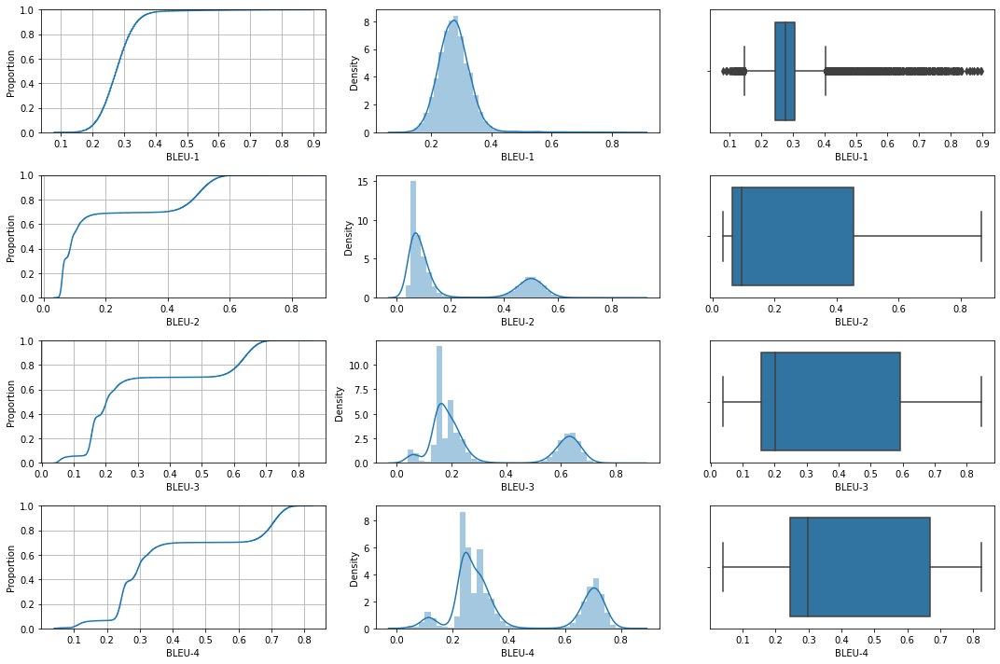

In [ ]:
fig, axs = plt.subplots(4,3, figsize=(15,10))
sns.ecdfplot(scifi_df['BLEU-1'], ax=axs[0,0])
axs[0,0].grid()
sns.distplot(scifi_df['BLEU-1'], ax=axs[0,1])
sns.boxplot(scifi_df['BLEU-1'], ax=axs[0,2])
sns.ecdfplot(scifi_df['BLEU-2'], ax=axs[1,0])
axs[1,0].grid()
sns.distplot(scifi_df['BLEU-2'], ax=axs[1,1])
sns.boxplot(scifi_df['BLEU-2'], ax=axs[1,2])
sns.ecdfplot(scifi_df['BLEU-3'], ax=axs[2,0])
axs[2,0].grid()
sns.distplot(scifi_df['BLEU-3'], ax=axs[2,1])
sns.boxplot(scifi_df['BLEU-3'], ax=axs[2,2])
sns.ecdfplot(scifi_df['BLEU-4'], ax=axs[3,0])
axs[3,0].grid()
sns.distplot(scifi_df['BLEU-4'], ax=axs[3,1])
sns.boxplot(scifi_df['BLEU-4'], ax=axs[3,2])
plt.tight_layout()

### Creating Supporting Features

In [ ]:
scifi_df['common']=[set(x.split()+y.split()) for x, y in scifi_df[['Input','Predicted']].values]
scifi_df['word_preset_in_input']=[set([i for i in y.split() if i in x.split()]) for x, y in scifi_df[['Input','Predicted']].values]
scifi_df['word_not_preset_in_input']=[set([i for i in y.split() if i not in x.split()]) for x, y in scifi_df[['Input','Predicted']].values]

In [ ]:
scifi_df.head()

,Input,Predicted,BLEU-1,BLEU-2,BLEU-3,BLEU-4,common,word_preset_in_input,word_not_preset_in_input
1990,"ancients, lie centuries of their secret probing into nature's laws their amazing discoveries of hidden processes of man's mind, and mastery of life's problems. once shrouded in mystery to avoid their destruction by mass fear and ignorance, these facts remain a useful heritage for thousands of men and women who privately use them in their homes today. rosicrucians not a religious organization an ageold brotherhood of learning, have preserved this secret wisdom in their archives","little lie up of life training probing into nature's laws their amazing discoveries of hidden processes of man's mind, and mastery of life's problems. once shrouded in mystery to avoid their destruction your mass fear of ignorance, these facts remain a useful heritage for thousands of men and women who privately use them in their homes today. thirtythree rosicrucians not a religious organization an ageold brotherhood of learning, have preserved their secret wisdom in their archives for",0.896104,0.855004,0.818900,0.786971,"{privately, mystery, homes, ancients,, thousands, organization, mass, of, problems., hidden, them, thirtythree, lie, for, destruction, by, up, little, training, heritage, ageold, wisdom, once, learning,, men, into, in, rosicrucians, discoveries, avoid, useful, archives, religious, not, amazing, probing, facts, mastery, secret, mind,, have, processes, remain, laws, centuries, these, brotherhood, who, ignorance,, their, to, women, preserved, an, life, nature's, and, life's, this, your, use, shrouded, a, fear, man's, today.}","{privately, mystery, homes, thousands, organization, mass, of, problems., hidden, them, lie, for, destruction, heritage, ageold, wisdom, once, learning,, men, into, in, rosicrucians, discoveries, avoid, useful, archives, religious, not, amazing, probing, facts, mastery, secret, mind,, have, processes, remain, laws, these, brotherhood, who, ignorance,, their, to, women, preserved, an, nature's, and, life's, use, shrouded, a, fear, man's, today.}","{training, little, your, thirtythree, up, life}"
4976,". entered as secondclass matter at post office, new york, n. y. copyright, new york , by galaxy publishing corporation, robert m. guinn, president. all rights, including translations reserved. all material submitted must be accompanied by selfaddressed stamped envelopes. publisher assumes no responsibility for unsolicited material. all stories printed in this magazine are fiction, and any similarity between characters and actual persons is coincidental. printed in u.s.a. by guinn co., inc., n. y. , n. y.","price thirtythree matter to post office, new york. and y. copyright, new york , by galaxy publishing corporation, robert m. guinn, president. all rights, including translations reserved. all material submitted must be accompanied by selfaddressed stamped envelopes. publisher assumes no responsibility for unsolicited material. all stories printed in this magazine are fiction, and any similarity between characters and actual persons is coincidental. printed in u.s.a. by guinn co., inc. n. y. title n. y. ,",0.894658,0.866937,0.844477,0.823559,"{any, must, galaxy, price, magazine, printed, as, between, characters, entered, material., thirtythree, selfaddressed, for, material, by, is, york., actual, similarity, u.s.a., coincidental., inc.,, stamped, in, new, guinn,, fiction,, no, president., ., matter, york, responsibility, translations, y., robert, m., n., york,, submitted, are, publishing, stories, at, envelopes., persons, accompanied, to, assumes, guinn, secondclass, office,, including, post, this, and, corporation,, inc., rights,, title, co.,, reserved., copyright,, all, unsolicited, ,, be, publisher}","{any, must, galaxy, magazine, printed, between, characters, material., selfaddressed, for, material, by, is, actual, similarity, u.s.a., coincidental., stamped, in, guinn,, new, fiction,, no, president., matter, yor

In [ ]:
scifi_df.tail()

,Input,Predicted,BLEU-1,BLEU-2,BLEU-3,BLEU-4,common,correct_predicion_word
63465,"to dig them out for himself. doctor walter said to captain, what's your mission to get us there and back. and frankly he turned to look at thirtythree flickering star there are angles to this thing that bother me. it's just possible that our mother planet might not be at all glad to see us. it should greet us with open arms, walter said. population problem was serious when colonists left. it will be critical by","you through into and most thirtythree how just thirtythree thirtythree your name going say. back asked thirtythree then tom where we pleaded. them, behind them robot's front thirtythree was some among point right wants observing lou dark that's it thirtythree thirtythree ought even have thirtythree thirtythree they bring and was die, someone of hands. covered they we've commissioner. has is thirtythree business. we big we garamond was be, too now.",0.104898,0.310292,0.448655,0.533670,"{you, dark, going, how, asked, by, serious, bring, look, when, that's, have, will, star, where, even, critical, us, most, doctor, population, there, me., was, us., arms,, he, be, it's, robot's, might, thirtythree, for, ought, wants, too, greet, back, point, front, said., that, die,, himself., get, colonists, possible, right, at, pleaded., your, dig, mission, planet, should, has, be,, of, name, said, them, angles, lou, them,, back., see, are, with, observing, some, through, to, out, problem, mother, now., captain,, all, frankly, garamond, commissioner., tom, flickering, big, bother, they, what's, our, among, behind, walter, is, glad, then, it, say., hands., business., into, covered, ...}","{and, your, was, it, just, them, thirtythree}"
10732,"old. no, i not kill death natural. i wanted live longer, but... he shrugged again. learned much from, thirtythree he founded thirtythree i his servant after thirtythree he idea very innocent cure not really sick with mild thirtythree he smiled thirtythree i also much thirtythree apply own idea, which not so innocent. fact, very thirtythree thirtythree right persons, they want martian then vote to let come, thirtythree maxwell broke in then why didn't you start in on right people","a i couldn't. remember you or no should to. free many and was and brother that of perhaps. thirtythree release an at wasn't specific seemed generation himself cried, buster pleasant and then even and something my hatred. yet did for it don't told far remember do jake when works. we is you tell thirtythree sort said at many had you thirtythree i continued tell them but always said. in. then, by are you tell briskly naming tour thirtythree or",0.101266,0.036032,0.111535,0.189820,"{you, generation, continued, idea,, shrugged, by, vote, natural., in, don't, learned, when, also, cried,, had, want, even, innocent., an, martian, or, works., death, was, which, jake, he, a, start, specific, buster, yet, from,, perhaps., briskly, thirtythree, wanted, old., for, again., innocent, said., that, pleasant, after, naming, mild, right, didn't, at, live, i, did, sort, my, brother, much, longer,, idea, founded, should, then,, apply, people, of, said, them, maxwell, tell, broke, but, something, do, always, to., his, very, no, let, sick, with, are, to, in., persons,, himself, wasn't, couldn't., many, come,, told, they, far, free, so, is, own, really, why, then, ...}","{thirtythree, you, i, then}"
31366,"have to call jane from her own battle station in sick bay to render first aid. but there was no time to lose. ensign reached out, flipped switches that would give him picture of interior of captain's thirtythree screen thirtythree came alive. grimes stared at luminous presentation in sick horror. luminous it was with that peculiar thirtythree of naked female flesh. jane was dressing herself with almost thirtythree haste. of captain","put make thirtythree thirtythree name thirtythree because what day bay. here. stand betty flying he wasn't such thirtythree for get t

### Word Cloud - Plotting

100%|██████████| 65056/65056 [00:01<00:00, 57440.77it/s]


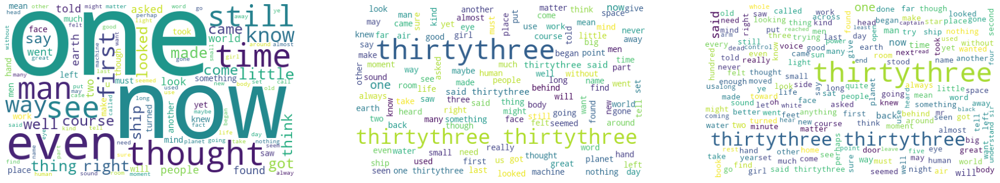

In [ ]:
scifi_text_word_cloud = word_cloud(scifi_text_data['scifi_text'])
input_word_cloud = word_cloud(scifi_df.Input)
predicted_word_cloud = word_cloud(scifi_df.Predicted)

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(scifi_text_word_cloud)
axs0.axis("off")
axs1.imshow(input_word_cloud)
axs1.axis("off")
axs2.imshow(predicted_word_cloud)
axs2.axis("off")

plt.show()

100%|██████████| 65056/65056 [00:01<00:00, 58573.37it/s]


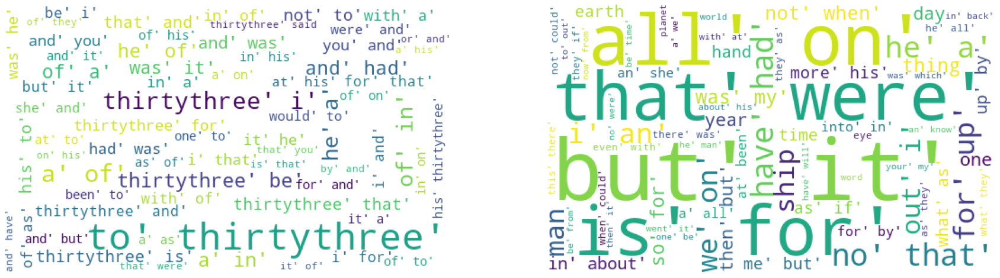

In [ ]:
word_preset_in_input_cloud = word_cloud(scifi_df.word_preset_in_input)
word_not_preset_in_input_cloud = word_cloud(scifi_df.word_not_preset_in_input)

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(word_preset_in_input_cloud)
axs0.axis("off")
axs1.imshow(word_not_preset_in_input_cloud)
axs1.axis("off")

plt.show()

In [ ]:
scifi_vocab_dict['thirtythree']

19999

## After fix of string 'thritythree' in Vocabulary Creation

>> Trained the model using 20k vocab using WhiteSpaceTokenizer

>> After fixing the string 'thritythree', next found to be most of the occurring words are not stripped with punctuations that because of using 'WhiteSpaceTokenizer' 

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.279665	0.207453	0.307062	0.388681

>> 99% of the scores were less than 0.4 and most of the scores lies between .2 and .4

    CDF ------------------------------------------------------- PDF ------------------------------------------------------- BoxPlot
![image](https://drive.google.com/uc?export=view&id=1rYofyFKi45IBAbxE48dXL_vHX92nrtBD)

>> Most of the test input found be UNK, could be the reason for low performance during model training

    Complete Data ------------------------------------------------ Test Input ------------------------------------------------ Test Predicted 
![image](https://drive.google.com/uc?export=view&id=1tYyXed7rKAaMddsDtP-Ja_6AsMSG5tM2)


### Model Training

In [ ]:
maxlen = 80
dropout = 0.2
rnn_units = 512
embed_dim = 256

model_type = 'scifi_lstm_model_with_full_data__20k_vocab_size'

scifi_lstm_model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=drive_path+f'{model_type}.hdf5', save_weights_only=True, save_best_only=False)

scifi_lstm_model = WordRNN(scifi_vocab_size, embed_dim, maxlen, dropout, rnn_units, kernel_reg=None, use_lstm=True)

scifi_lstm_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

scifi_lstm_model.fit(scifi_train_dataset, shuffle=True, epochs=10, validation_data=scifi_test_dataset, callbacks=scifi_lstm_model_checkpoint)


Epoch 1/10
8132/8132 [==============================] - 397s 48ms/step - loss: 5.5012 - val_loss: 5.1505
Epoch 2/10
8132/8132 [==============================] - 386s 48ms/step - loss: 5.0430 - val_loss: 4.9768
Epoch 3/10
8132/8132 [==============================] - 386s 47ms/step - loss: 4.8882 - val_loss: 4.8976
Epoch 4/10
8132/8132 [==============================] - 386s 47ms/step - loss: 4.7939 - val_loss: 4.8561
Epoch 5/10
8132/8132 [==============================] - 386s 47ms/step - loss: 4.7294 - val_loss: 4.8329
Epoch 6/10
8132/8132 [==============================] - 387s 48ms/step - loss: 4.6815 - val_loss: 4.8207
Epoch 7/10
8132/8132 [==============================] - 386s 47ms/step - loss: 4.6446 - val_loss: 4.8128
Epoch 8/10
8132/8132 [==============================] - 386s 47ms/step - loss: 4.6153 - val_loss: 4.8098
Epoch 9/10
8132/8132 [==============================] - 389s 48ms/step - loss: 4.5911 - val_loss: 4.8086
Epoch 10/10
8132/8132 [==============================] 

In [ ]:
scifi_vocab_dict = get_vocab('scifi_data', scifi_vocab_table)
scifi_id_lookup = {val: key for key, val in scifi_vocab_dict.items()}

In [ ]:
input_tokens = []
for input_example_batch, target_example_batch in tqdm(scifi_test_dataset.as_numpy_iterator()):
  for idx in range(input_example_batch.shape[0]):
    input_tokens.extend(input_example_batch[idx])
tokens_count = {(key, scifi_id_lookup[key]): val for key, val in Counter(input_tokens).items()}
#tokens_count[(19999, 'thirtythree')]
tokens_count = sorted(tokens_count.items(), key=lambda x: x[1], reverse=True)
tokens_count

2033it [00:06, 307.22it/s]


[((19999, 'UNK'), 432179),
 ((1, 'the'), 301133),
 ((2, 'and'), 130982),
 ((3, 'of'), 128835),
 ((4, 'to'), 125265),
 ((5, 'a'), 124025),
 ((6, 'he'), 77962),
 ((7, 'in'), 70111),
 ((8, 'i'), 68887),
 ((9, 'was'), 64554),
 ((10, 'it'), 55793),
 ((11, 'that'), 53192),
 ((12, 'you'), 48204),
 ((13, 'his'), 45735),
 ((14, 'had'), 39024),
 ((15, 'for'), 35895),
 ((16, 'with'), 32859),
 ((17, 'on'), 32571),
 ((18, 'but'), 32357),
 ((19, 'as'), 30896),
 ((20, 'at'), 28870),
 ((21, 'is'), 27897),
 ((22, 'be'), 26469),
 ((23, 'they'), 25202),
 ((24, 'not'), 23954),
 ((25, 'have'), 23157),
 ((27, 'we'), 21007),
 ((26, 'from'), 20907),
 ((28, 'she'), 19469),
 ((30, 'this'), 19356),
 ((29, 'were'), 19192),
 ((31, 'all'), 18114),
 ((32, 'what'), 17649),
 ((34, 'one'), 16952),
 ((33, 'if'), 16812),
 ((35, 'by'), 16800),
 ((36, 'there'), 16097),
 ((37, 'an'), 15987),
 ((38, 'would'), 15671),
 ((40, 'out'), 15617),
 ((39, 'her'), 15371),
 ((41, 'my'), 14940),
 ((42, 'no'), 14480),
 ((43, 'or'), 14109

### Predictions with BLEU(1-4) Scores

In [ ]:
scifi_vocab_dict = get_vocab('scifi_data', scifi_vocab_table)
scifi_id_lookup = {val: key for key, val in scifi_vocab_dict.items()}
scifi_input, scifi_predicted, scifi_BLEU1, scifi_BLEU2, scifi_BLEU3, scifi_BLEU4 = [], [], [], [], [], []
model_type='lstm'

for input_example_batch, target_example_batch in tqdm(scifi_test_dataset.as_numpy_iterator()):
  for idx in range(input_example_batch.shape[0]):
    if model_type=='lstm':
      # lstm will have both states hidden and cell
      predicted_logits, h_states, c_states = predict_one_step(scifi_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
    elif model_type=='gru':
      # gru will have only hidden state
      predicted_logits, h_states = predict_one_step(scifi_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
    elif model_type=='attention':
      # Attn model
      predicted_logits = predict_one_step(scifi_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
    predicted_indices = tf.random.categorical(predicted_logits[-1,:,:], num_samples=1)
    predicted_indices = tf.squeeze(predicted_indices, axis=-1).numpy()
    #print(input_example_batch[idx])
    input_text = ' '.join([scifi_id_lookup[id] for id in input_example_batch[idx] if id not in [0, 1]])
    scifi_input.append(input_text)
    predicted_text = ' '.join([scifi_id_lookup[id] for id in predicted_indices if id not in [0, 1]])
    scifi_predicted.append(predicted_text)
    scifi_BLEU1.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(1, 0, 0, 0)))
    scifi_BLEU2.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.5, .5, 0, 0)))
    scifi_BLEU3.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.33, .33, .33, 0)))
    scifi_BLEU4.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.25, .25, .25, .25)))


2033it [11:24,  2.97it/s]


In [ ]:
scifi_df = pd.DataFrame({'Input':scifi_input, 'Predicted':scifi_predicted, 'BLEU-1':scifi_BLEU1, 'BLEU-2':scifi_BLEU2, 'BLEU-3':scifi_BLEU3, 'BLEU-4':scifi_BLEU4}).sort_values(['BLEU-1','BLEU-2','BLEU-3','BLEU-4'], ascending=False)


### BLEU Scores

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.279665	0.207453	0.307062	0.388681

In [ ]:
scifi_df.describe()

,BLEU-1,BLEU-2,BLEU-3,BLEU-4
count,65056.000000,65056.000000,65056.000000,65056.000000
mean,0.279665,0.207453,0.307062,0.388681
std,0.058820,0.191271,0.210072,0.205985
min,0.083333,0.037463,0.040169,0.040639
25%,0.243507,0.063817,0.156835,0.244442
50%,0.276291,0.095513,0.202051,0.295831
75%,0.310693,0.450225,0.585268,0.662215
max,0.922078,0.901601,0.881702,0.858978


### Plotting BLEU Scores

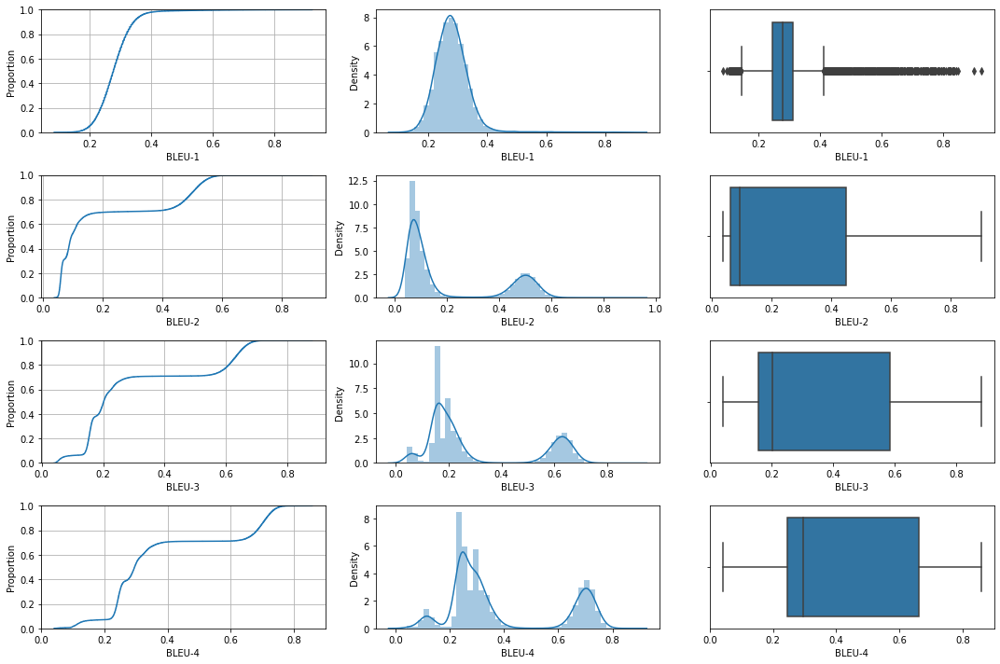

In [ ]:
fig, axs = plt.subplots(4,3, figsize=(15,10))
sns.ecdfplot(scifi_df['BLEU-1'], ax=axs[0,0])
axs[0,0].grid()
sns.distplot(scifi_df['BLEU-1'], ax=axs[0,1])
sns.boxplot(scifi_df['BLEU-1'], ax=axs[0,2])
sns.ecdfplot(scifi_df['BLEU-2'], ax=axs[1,0])
axs[1,0].grid()
sns.distplot(scifi_df['BLEU-2'], ax=axs[1,1])
sns.boxplot(scifi_df['BLEU-2'], ax=axs[1,2])
sns.ecdfplot(scifi_df['BLEU-3'], ax=axs[2,0])
axs[2,0].grid()
sns.distplot(scifi_df['BLEU-3'], ax=axs[2,1])
sns.boxplot(scifi_df['BLEU-3'], ax=axs[2,2])
sns.ecdfplot(scifi_df['BLEU-4'], ax=axs[3,0])
axs[3,0].grid()
sns.distplot(scifi_df['BLEU-4'], ax=axs[3,1])
sns.boxplot(scifi_df['BLEU-4'], ax=axs[3,2])
plt.tight_layout()

### Creating Supporting Features

In [ ]:
scifi_df['common']=[set(x.split()+y.split()) for x, y in scifi_df[['Input','Predicted']].values]
scifi_df['word_preset_in_input']=[set([i for i in y.split() if i in x.split()]) for x, y in scifi_df[['Input','Predicted']].values]
scifi_df['word_not_preset_in_input']=[set([i for i in y.split() if i not in x.split()]) for x, y in scifi_df[['Input','Predicted']].values]


In [ ]:
scifi_df.head()

,Input,Predicted,BLEU-1,BLEU-2,BLEU-3,BLEU-4,common,word_preset_in_input,word_not_preset_in_input
16836,"mexico, south and central america and u. s. possessions. elsewhere . entered as secondclass matter at post office, new york, n. y. copyright, new york , by galaxy publishing corporation, robert m. guinn, president. all rights, including translations reserved. ah material submitted must be accompanied by selfaddressed stamped envelopes. publisher assumes no responsibility for unsolicited material. all stories printed in this magazine are fiction, and any similarity between characters and actual persons is coincidental. printed in u.s.a.","north america, central america and u. s. possessions. elsewhere . secondclass as secondclass matter at post office, new york, n. y. copyright, new york , by galaxy publishing corporation. robert m. guinn, president. all rights, including translations reserved. all material submitted must be accompanied by selfaddressed stamped envelopes. publisher assumes no responsibility for unsolicited material. all stories printed in this magazine are fiction, and any similarity between characters and actual persons is coincidental. printed in u.s.a. by",0.922078,0.901601,0.881702,0.858978,"{u., post, ., galaxy, as, be, similarity, s., elsewhere, york,, u.s.a., corporation., envelopes., matter, fiction,, submitted, mexico,, m., must, for, at, n., is, publishing, guinn,, publisher, robert, printed, new, material, selfaddressed, stamped, this, and, between, characters, president., entered, office,, central, y., corporation,, rights,, translations, responsibility, magazine, coincidental., york, america, no, america,, actual, assumes, south, material., accompanied, by, all, in, possessions., including, are, unsolicited, stories, copyright,, any, secondclass, ah, north, persons, reserved., ,}","{u., post, ., galaxy, as, be, similarity, s., elsewhere, york,, u.s.a., envelopes., matter, fiction,, submitted, m., must, for, at, n., is, publishing, guinn,, publisher, robert, printed, new, material, selfaddressed, stamped, this, and, between, characters, president., office,, responsibility, central, y., rights,, translations, magazine, coincidental., york, america, no, actual, assumes, material., accompanied, by, all, in, possessions., including, are, unsolicited, stories, copyright,, any, secondclass, persons, reserved., ,}","{north, america,, corporation.}"
28981,"united states, canada, mexico, south and central america and u. s. possessions. elsewhere UNK entered as secondclass matter at post office, new york, n. y. copyright, new york UNK by galaxy publishing corporation, robert m. guinn, president. all rights, including translations reserved. all material submitted must be accompanied by selfaddressed stamped envelopes. publisher assumes no responsibility for unsolicited material. all stories printed in this magazine are fiction, and any similarity between characters and actual persons is coincidental. printed","states ond mexico, south and central america and u.s. s. possessions. elsewhere . entered as UNK matter at post office, new york, n. y. copyright, new york , at UNK publishing corporation, robert m. guinn, president. all rights, including translations reserved. all material submitted must be accompanied by selfaddressed stamped envelopes. publisher assumes no responsibility for unsolicited material. ail stories printed in this magazine are fiction, and any similarity between characters and actual persons is coincidental. printed in",0.897436,0.850065,0.812217,0.775706,"{u., post, ., galaxy, as, be, similarity, s., elsewhere, york,, envelopes., matter, states,, fiction,, ond, ail, submitted, u.s., mexico,, m., must, for, states, at, n., is, publishing, guinn,, publisher, robert, united, printed, new, material, selfaddressed, stamped, this, and, between, characters, president., entered, office,, central, y., corporation,, rights,, translations, responsibility, magazine, coincidental., york, america, no,

### Word Cloud - Plotting

100%|██████████| 65056/65056 [00:01<00:00, 59790.22it/s]


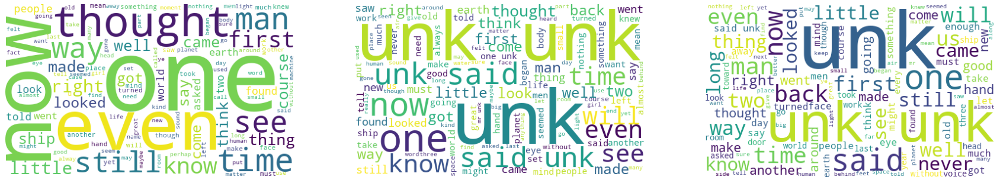

In [ ]:
scifi_text_word_cloud = word_cloud(scifi_text_data['scifi_text']) # overall dataset word cloud
input_word_cloud = word_cloud(scifi_df.Input)                     # test input data word cloud
predicted_word_cloud = word_cloud(scifi_df.Predicted)             # test predicted data word cloud

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(scifi_text_word_cloud)
axs0.axis("off")
axs1.imshow(input_word_cloud)
axs1.axis("off")
axs2.imshow(predicted_word_cloud)
axs2.axis("off")

plt.show()

100%|██████████| 65056/65056 [00:01<00:00, 61848.63it/s]


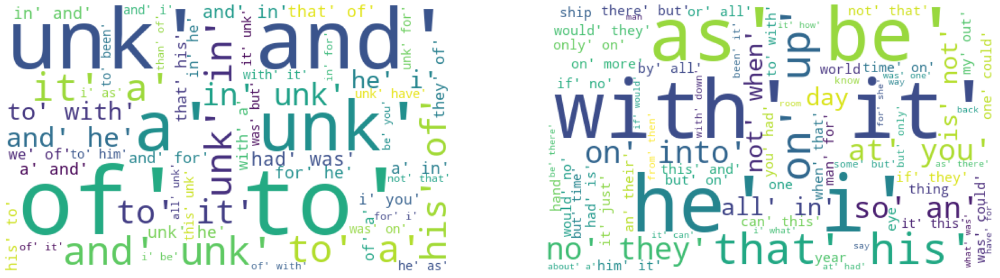

In [ ]:
word_preset_in_input_cloud = word_cloud(scifi_df.word_preset_in_input)          # predicted word present in input data word cloud
word_not_preset_in_input_cloud = word_cloud(scifi_df.word_not_preset_in_input)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(word_preset_in_input_cloud)
axs0.axis("off")
axs1.imshow(word_not_preset_in_input_cloud)
axs1.axis("off")

plt.show()

## Using UnicodeScriptTokenizer

>> Trained the model using same 20k vocab size but with UnicodeScriptTokenizer

>> Found to be most often predicted word with punctuations instead predicting them separately. So, changed the tokenizer to 'UnicodeScriptTokenizer' and the now model got improved with lift in BLEU scores

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.368759	0.142614	0.221086	0.305025

>> 80% of the scores were less than 0.4 and most of the scores lies between .2 and .5

    CDF ------------------------------------------------------- PDF ------------------------------------------------------- BoxPlot
![image](https://drive.google.com/uc?export=view&id=1H0eFQmZvHoJub2xh9t_cbqH61uvd2CVf)

>> Most of the test input found be UNK, could be the reason for low performance during model training

    Complete Data ------------------------------------------------ Test Input ------------------------------------------------ Test Predicted 
![image](https://drive.google.com/uc?export=view&id=1kHvEVtICtLWYf0e7F1LNXlIoJ7jaIhXm)


### Data processing with UnicodeScriptTokenizer

In [ ]:
# with UnicodeScriptTokenizer
seq_len = 80
max_tokens = 20000
batch_size = 32
buffer_size = 1000

scifi_unicode_tokenizer = tf_text.UnicodeScriptTokenizer()

scifi_unicode_data, scifi_unicode_vocab_table, scifi_unicode_vocab_size = get_data_and_vocab_table('scifi_unicode_data', scifi_unicode_tokenizer, scifi_text_data['scifi_text'].values, max_tokens, seq_len)

scifi_unicode_train_dataset, scifi_unicode_test_dataset = splitup_train_test(scifi_unicode_data[1:-1], scifi_unicode_tokenizer, scifi_unicode_vocab_table, batch_size, buffer_size)


100%|██████████| 325298/325298 [00:00<00:00, 377861.02it/s]



Text split sequence - completed


Tokenization - completed



325298it [01:13, 4431.08it/s]


Full Vocab size:  273833
Filterd Vocab size:  19999

Construction of Vocab - completed



### Model Training

In [ ]:
model_unicode_type = 'scifi_lstm_model_with_full_data_unicode_20k_vocab_size'

scifi_unicode_lstm_model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=drive_path+f'{model_unicode_type}.hdf5', save_weights_only=True, save_best_only=False)

scifi_unicode_lstm_model = WordRNN(scifi_unicode_vocab_size, embed_dim, maxlen, dropout, rnn_units, kernel_reg=None, use_lstm=True)

scifi_unicode_lstm_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

scifi_unicode_lstm_model.fit(scifi_unicode_train_dataset, shuffle=True, epochs=10, validation_data=scifi_unicode_test_dataset, callbacks=scifi_unicode_lstm_model_checkpoint)


Epoch 1/10
8132/8132 [==============================] - 533s 65ms/step - loss: 4.4035 - val_loss: 4.0841
Epoch 2/10
8132/8132 [==============================] - 524s 64ms/step - loss: 3.9937 - val_loss: 3.9418
Epoch 3/10
8132/8132 [==============================] - 519s 64ms/step - loss: 3.8717 - val_loss: 3.8773
Epoch 4/10
8132/8132 [==============================] - 520s 64ms/step - loss: 3.7983 - val_loss: 3.8415
Epoch 5/10
8132/8132 [==============================] - 520s 64ms/step - loss: 3.7475 - val_loss: 3.8201
Epoch 6/10
8132/8132 [==============================] - 522s 64ms/step - loss: 3.7100 - val_loss: 3.8075
Epoch 7/10
8132/8132 [==============================] - 520s 64ms/step - loss: 3.6810 - val_loss: 3.7987
Epoch 8/10
8132/8132 [==============================] - 522s 64ms/step - loss: 3.6578 - val_loss: 3.7935
Epoch 9/10
8132/8132 [==============================] - 522s 64ms/step - loss: 3.6388 - val_loss: 3.7902
Epoch 10/10
8132/8132 [==============================] 

In [ ]:
## load the model using trained weights

maxlen = 80
dropout = 0.2
rnn_units = 512
embed_dim = 256

scifi_unicode_lstm_model = WordRNN(scifi_unicode_vocab_size, embed_dim, maxlen, dropout, rnn_units, kernel_reg=None, use_lstm=True)

for input_example_batch, target_example_batch in tqdm(scifi_unicode_test_dataset.take(1)):
    pred = scifi_unicode_lstm_model(input_example_batch)

scifi_unicode_lstm_model.load_weights(drive_path+'scifi_lstm_model_with_full_data_unicode_20k_vocab_size.hdf5')


100%|██████████| 1/1 [00:03<00:00,  3.03s/it]


### Predictions with BLEU(1-4) Scores

In [ ]:
scifi_unicode_vocab_dict = get_vocab('scifi_unicode_data', scifi_unicode_vocab_table)
scifi_unicode_id_lookup = {val: key for key, val in scifi_unicode_vocab_dict.items()}
scifi_data_type, scifi_unicode_input, scifi_unicode_target, scifi_unicode_predicted, scifi_unicode_BLEU1, scifi_unicode_BLEU2, scifi_unicode_BLEU3, scifi_unicode_BLEU4 = [], [], [], [], [], [], [], []
model_type='lstm'

for data_type, data in {'train':scifi_unicode_train_dataset, 'test':scifi_unicode_test_dataset}.items():
  for input_example_batch, target_example_batch in tqdm(data.as_numpy_iterator()):
    for idx in range(input_example_batch.shape[0]):
      if model_type=='lstm':
        # lstm will have both states hidden and cell
        predicted_logits, h_states, c_states = predict_one_step(scifi_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      elif model_type=='gru':
        # gru will have only hidden state
        predicted_logits, h_states = predict_one_step(scifi_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      elif model_type=='attention':
        # Attn model
        predicted_logits = predict_one_step(scifi_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      predicted_indices = tf.random.categorical(predicted_logits[-1,:,:], num_samples=1)
      predicted_indices = tf.squeeze(predicted_indices, axis=-1).numpy()
      #print(input_example_batch[idx])
      scifi_data_type.append(data_type)
      input_text = ' '.join([scifi_unicode_id_lookup.get(id) for id in input_example_batch[idx] if id!=0 ])
      scifi_unicode_input.append(input_text)
      target_text = ' '.join([scifi_unicode_id_lookup.get(id) for id in target_example_batch[idx] if id!=0])
      scifi_unicode_target.append(target_text)
      predicted_text = ' '.join([scifi_unicode_id_lookup.get(id) for id in predicted_indices if id!=0])
      scifi_unicode_predicted.append(predicted_text)
      scifi_unicode_BLEU1.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(1, 0, 0, 0)))
      scifi_unicode_BLEU2.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.5, .5, 0, 0)))
      scifi_unicode_BLEU3.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.33, .33, .33, 0)))
      scifi_unicode_BLEU4.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.25, .25, .25, .25)))


8132it [49:05,  2.76it/s]
2033it [12:00,  2.82it/s]


In [ ]:
scifi_unicode_df = pd.DataFrame({'Data_Type': scifi_data_type, 'Input':scifi_unicode_input, 'Predicted':scifi_unicode_predicted, 'BLEU-1':scifi_unicode_BLEU1, 'BLEU-2':scifi_unicode_BLEU2, 'BLEU-3':scifi_unicode_BLEU3, 'BLEU-4':scifi_unicode_BLEU4}).sort_values(['BLEU-1','BLEU-2','BLEU-3','BLEU-4'], ascending=False)

In [ ]:
scifi_unicode_df.head()

,Data_Type,Input,Predicted,BLEU-1,BLEU-2,BLEU-3,BLEU-4,common,word_preset_in_input,word_not_preset_in_input,word_not_preset_in_vocab
89860,train,"y . c per copy . subscription copies per year in the united states , canada , mexico , south and central america and u . s . possessions . elsewhere . entered as secondclass matter at the post office , new york , n . y . copyright , new york , by galaxy publishing corporation , robert m . guinn , president . all rights , including translations reserved . all material submitted must be accompanied by selfaddressed stamped envelopes . the publisher assumes no responsibility for unsolicited material . all stories printed in this magazine are fiction , and","ou vega . copy . issue copies per year in the united states , canada , mexico , south and central america and u . s . possessions , elsewhere . per as secondclass matter at the post office , new york , n . y . copyright , new york , by galaxy publishing corporation . robert m . guinn , president . all rights including including translation reserved . all material submitted must be accompanied by selfaddressed stamped envelopes . the publisher assumes no responsibility for unsolicited material . all stories printed in this magazine are fiction , and any",0.941176,0.889988,0.856664,0.829766,"{south, ,, president, must, translation, corporation, in, c, be, stories, copies, u, assumes, secondclass, material, per, robert, m, copy, magazine, publisher, matter, publishing, no, mexico, as, responsibility, are, n, submitted, entered, reserved, york, at, y, and, accompanied, all, fiction, stamped, elsewhere, guinn, central, subscription, year, possessions, the, selfaddressed, envelopes, america, for, printed, unsolicited, this, post, canada, galaxy, new, ., by, copyright, issue, united, office, including, rights, states, s, ou, vega, any, translations}","{south, ,, president, must, corporation, in, be, stories, copies, u, assumes, secondclass, material, per, robert, m, copy, magazine, publisher, matter, publishing, no, mexico, as, responsibility, are, n, submitted, reserved, york, at, y, and, accompanied, all, fiction, stamped, elsewhere, guinn, central, year, possessions, the, selfaddressed, envelopes, america, for, printed, unsolicited, this, post, canada, galaxy, new, ., by, copyright, united, office, including, rights, states, s}","{issue, translation, ou, vega, any}",{}
116615,train,"u . s . possessions . elsewhere . entered as secondclass matter at the post office , new york , n . y . copyright . new york , by galaxy publishing corporation , robert m . guinn , president . all rights , including translations reserved . all material submitted must be accompanied by selfaddressed stamped envelopes . the publisher assumes no responsibility for unsolicited material . all stories printed in this magazine are fiction , and any similarity between characters and actual persons is coincidental . printed in the u . s . a . by the guinn co ., inc ., n . y","t s . shrewd by elsewhere . s as secondclass matter at the post office , new york , n . y . copyright , by ., , by galaxy publishing corporation , robert m . guinn , president . all rights , including translations reserved . all material submitted must be accompanied by selfaddressed stamped envelopes . the publisher assumes no responsibility for unsolicited material . all stories printed in this magazine are fiction , and any similarity between characters and actual persons is coincidental . printed in u u . s . a . this tomorrow guinn co ., inc ., n . y .",0.925234,0.891238,0.861024,0.836148,"{shrewd, president, ,, must, corporation, in, be, stories, u, assumes, secondclass, material, is, m, robert, persons, characters, actual, magazine, publisher, matter, publishing, no, responsibility, as, .,, are, n, submitted, a, tomorrow, entered, reserved, york, at, y, accompanied, and, all, fiction, stamped, elsewhere, guinn, coincidental, envelopes, possessions, the, selfaddressed, for, printed, this, u

### BLEU Scores

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.368759	0.142614	0.221086	0.305025


In [ ]:
scifi_unicode_df[scifi_unicode_df.Data_Type=='train'].describe()

,BLEU-1,BLEU-2,BLEU-3,BLEU-4
count,260224.000000,260224.000000,260224.000000,260224.000000
mean,0.373805,0.144611,0.219335,0.302361
std,0.058139,0.109975,0.131325,0.139324
min,0.151163,0.042289,0.038588,0.036815
25%,0.337079,0.090598,0.155652,0.243154
50%,0.370787,0.119611,0.213726,0.308671
75%,0.404255,0.150648,0.259386,0.358872
max,0.941176,0.891238,0.866460,0.842176


In [ ]:
scifi_unicode_df[scifi_unicode_df.Data_Type=='test'].describe()

,BLEU-1,BLEU-2,BLEU-3,BLEU-4
count,65056.000000,65056.000000,65056.000000,65056.000000
mean,0.368759,0.142614,0.221086,0.305025
std,0.056635,0.111692,0.132130,0.139124
min,0.146341,0.045835,0.035949,0.036928
25%,0.333333,0.088789,0.157025,0.245096
50%,0.366667,0.115688,0.212694,0.307652
75%,0.400000,0.147122,0.257277,0.356743
max,0.913462,0.873325,0.844030,0.831173


### Plotting BLEU Scores

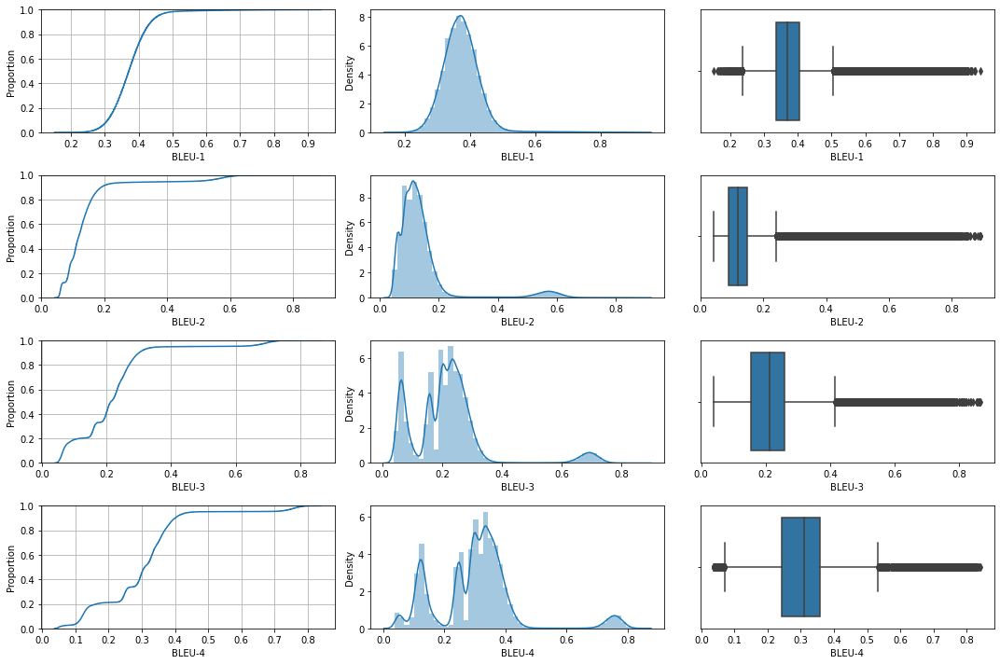

In [ ]:
train = scifi_unicode_df[scifi_unicode_df.Data_Type=='train']
fig, axs = plt.subplots(4,3, figsize=(15,10))
sns.ecdfplot(train['BLEU-1'], ax=axs[0,0])
axs[0,0].grid()
sns.distplot(train['BLEU-1'], ax=axs[0,1])
sns.boxplot(train['BLEU-1'], ax=axs[0,2])
sns.ecdfplot(train['BLEU-2'], ax=axs[1,0])
axs[1,0].grid()
sns.distplot(train['BLEU-2'], ax=axs[1,1])
sns.boxplot(train['BLEU-2'], ax=axs[1,2])
sns.ecdfplot(train['BLEU-3'], ax=axs[2,0])
axs[2,0].grid()
sns.distplot(train['BLEU-3'], ax=axs[2,1])
sns.boxplot(train['BLEU-3'], ax=axs[2,2])
sns.ecdfplot(train['BLEU-4'], ax=axs[3,0])
axs[3,0].grid()
sns.distplot(train['BLEU-4'], ax=axs[3,1])
sns.boxplot(train['BLEU-4'], ax=axs[3,2])
plt.tight_layout()

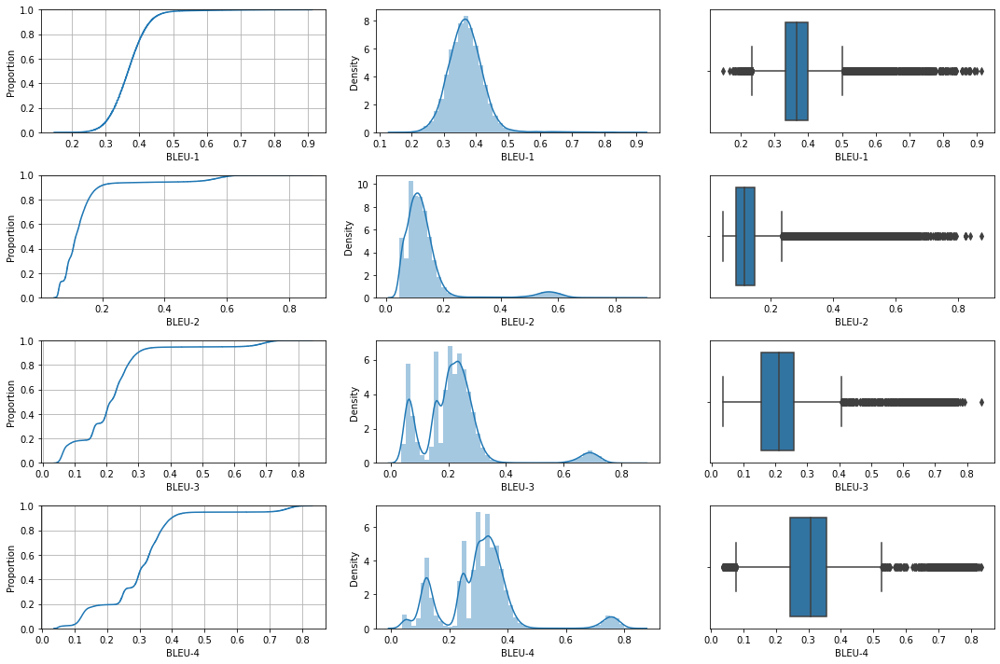

In [ ]:
test = scifi_unicode_df[scifi_unicode_df.Data_Type=='test']
fig, axs = plt.subplots(4,3, figsize=(15,10))
sns.ecdfplot(test['BLEU-1'], ax=axs[0,0])
axs[0,0].grid()
sns.distplot(test['BLEU-1'], ax=axs[0,1])
sns.boxplot(test['BLEU-1'], ax=axs[0,2])
sns.ecdfplot(test['BLEU-2'], ax=axs[1,0])
axs[1,0].grid()
sns.distplot(test['BLEU-2'], ax=axs[1,1])
sns.boxplot(test['BLEU-2'], ax=axs[1,2])
sns.ecdfplot(test['BLEU-3'], ax=axs[2,0])
axs[2,0].grid()
sns.distplot(test['BLEU-3'], ax=axs[2,1])
sns.boxplot(test['BLEU-3'], ax=axs[2,2])
sns.ecdfplot(test['BLEU-4'], ax=axs[3,0])
axs[3,0].grid()
sns.distplot(test['BLEU-4'], ax=axs[3,1])
sns.boxplot(test['BLEU-4'], ax=axs[3,2])
plt.tight_layout()

### Creating Supporting Features

In [ ]:
scifi_unicode_vocab_keys = list(scifi_unicode_vocab_dict.keys())

scifi_unicode_df['common']=[set(x.split()+y.split()) for x, y in tqdm(scifi_unicode_df[['Input','Predicted']].values)]
scifi_unicode_df['word_preset_in_input']=[set([i for i in y.split() if i in x.split()]) for x, y in tqdm(scifi_unicode_df[['Input','Predicted']].values)]
scifi_unicode_df['word_not_preset_in_input']=[set([i for i in y.split() if i not in x.split()]) for x, y in tqdm(scifi_unicode_df[['Input','Predicted']].values)]


100%|██████████| 325280/325280 [12:55<00:00, 419.68it/s]


In [ ]:
def create_dict(values):
  predicted_dict = collections.defaultdict(lambda: 0)
  for toks in tqdm(values):
      for tok in toks.split():
        predicted_dict[tok] += 1
  vocab = [tok for tok, val in sorted(predicted_dict.items(), key=lambda x: x[1], reverse=True)]
  return vocab

In [ ]:
#best = create_dict(scifi_unicode_df[scifi_unicode_df['BLEU-1']>.50]['Predicted'].values)
best[-20:]

['starter',
 'penny',
 'conceal',
 'mantle',
 'alarmed',
 'stake',
 'lolling',
 'ballod',
 'sly',
 'elated',
 'sliced',
 'horrified',
 'penelope',
 'whitey',
 'thereby',
 'linked',
 'chopping',
 'ekstrohm',
 'consists',
 'dimensional']

In [ ]:
#worst = create_dict(scifi_unicode_df[scifi_unicode_df['BLEU-1']<.50]['Predicted'].values)
worst[-20:]

['grime',
 'teu',
 'cade',
 'tokay',
 'guerrilla',
 'secondclass',
 'hildemar',
 'gf',
 'mgr',
 'helpfulness',
 'attune',
 'braille',
 'tunick',
 'mortgages',
 'loaning',
 'rapp',
 'inl',
 'finagle',
 'lynd',
 'panamerican']

### Word Cloud - Plotting


100%|██████████| 260224/260224 [00:05<00:00, 45397.78it/s]


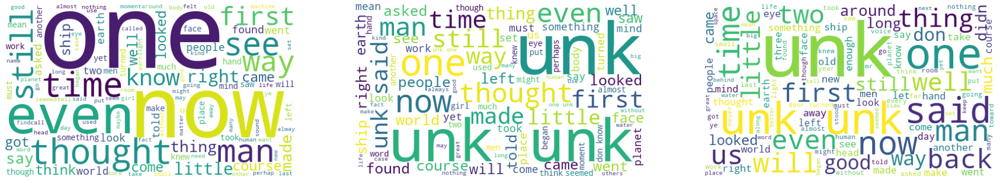

In [ ]:
scifi_unicode_text_word_cloud = word_cloud(scifi_text_data['scifi_text']) # overall dataset word cloud
train_unicode_word_input = word_cloud(scifi_unicode_df[scifi_unicode_df.Data_Type=='train'].Input)          # predicted word present in input data word cloud
train_unicode_word_predicted = word_cloud(scifi_unicode_df[scifi_unicode_df.Data_Type=='train'].Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(scifi_unicode_text_word_cloud)
axs0.axis("off")
axs1.imshow(train_unicode_word_input)
axs1.axis("off")
axs2.imshow(train_unicode_word_predicted)
axs2.axis("off")

plt.show()

100%|██████████| 260224/260224 [00:04<00:00, 57377.12it/s]


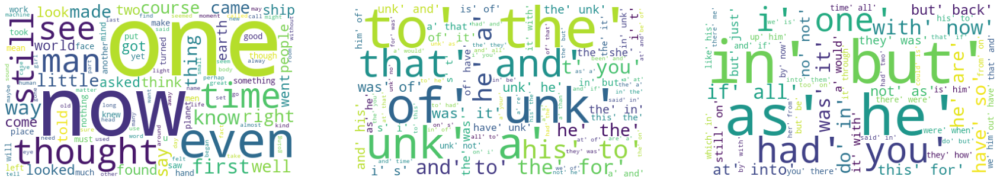

In [ ]:
scifi_unicode_text_word_cloud = word_cloud(scifi_text_data['scifi_text']) # overall dataset word cloud
train_unicode_word_preset_in_input_cloud = word_cloud(scifi_unicode_df[scifi_unicode_df.Data_Type=='train'].word_preset_in_input)          # predicted word present in input data word cloud
train_unicode_word_not_preset_in_input_cloud = word_cloud(scifi_unicode_df[scifi_unicode_df.Data_Type=='train'].word_not_preset_in_input)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(scifi_unicode_text_word_cloud)
axs0.axis("off")
axs1.imshow(train_unicode_word_preset_in_input_cloud)
axs1.axis("off")
axs2.imshow(train_unicode_word_not_preset_in_input_cloud)
axs2.axis("off")

plt.show()

100%|██████████| 65056/65056 [00:01<00:00, 49640.53it/s]


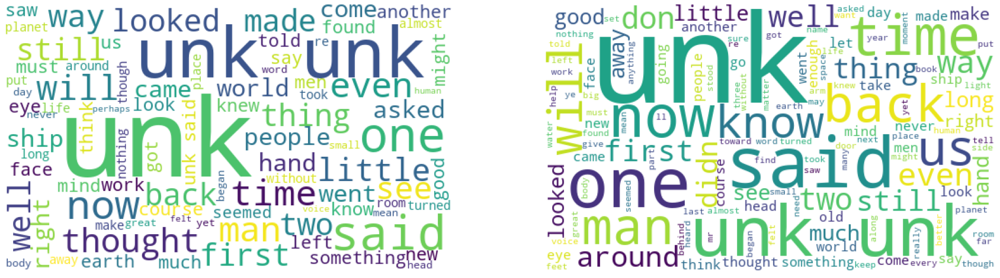

In [ ]:
test_unicode_word_input = word_cloud(scifi_unicode_df[scifi_unicode_df.Data_Type=='test'].Input)          # predicted word present in input data word cloud
test_unicode_word_predicted = word_cloud(scifi_unicode_df[scifi_unicode_df.Data_Type=='test'].Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(test_unicode_word_input)
axs0.axis("off")
axs1.imshow(test_unicode_word_predicted)
axs1.axis("off")

plt.show()

100%|██████████| 5054/5054 [00:00<00:00, 46416.94it/s]


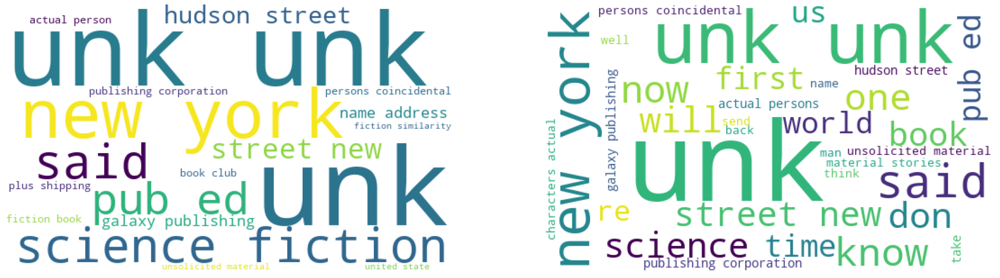

In [ ]:
test_unicode_word_input = word_cloud(scifi_unicode_df[(scifi_unicode_df['BLEU-1']>.50)].Input)          # predicted word present in input data word cloud
test_unicode_word_predicted = word_cloud(scifi_unicode_df[(scifi_unicode_df['BLEU-1']>.50)].Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(test_unicode_word_input)
axs0.axis("off")
axs1.imshow(test_unicode_word_predicted)
axs1.axis("off")

plt.show()

100%|██████████| 86152/86152 [00:01<00:00, 47115.38it/s]


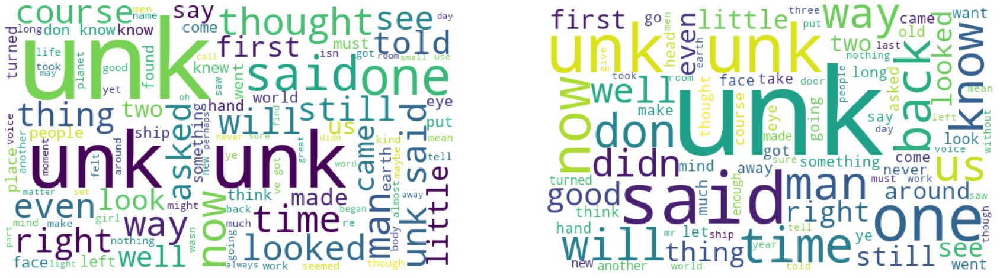

In [ ]:
test_unicode_word_input = word_cloud(scifi_unicode_df[(scifi_unicode_df['BLEU-1']>=.40) & (scifi_unicode_df['BLEU-1']<=.50)].Input)          # predicted word present in input data word cloud
test_unicode_word_predicted = word_cloud(scifi_unicode_df[(scifi_unicode_df['BLEU-1']>=.40) & (scifi_unicode_df['BLEU-1']<=.50)].Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(test_unicode_word_input)
axs0.axis("off")
axs1.imshow(test_unicode_word_predicted)
axs1.axis("off")

plt.show()

100%|██████████| 234074/234074 [00:04<00:00, 46869.48it/s]


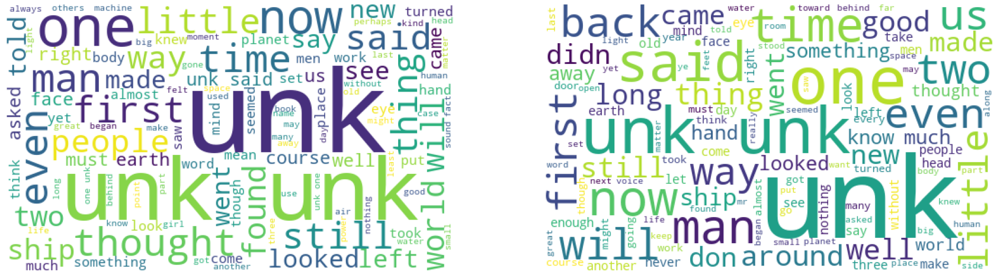

In [ ]:
test_unicode_word_input = word_cloud(scifi_unicode_df[(scifi_unicode_df['BLEU-1']<.40)].Input)          # predicted word present in input data word cloud
test_unicode_word_predicted = word_cloud(scifi_unicode_df[(scifi_unicode_df['BLEU-1']<.40)].Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(test_unicode_word_input)
axs0.axis("off")
axs1.imshow(test_unicode_word_predicted)
axs1.axis("off")

plt.show()

100%|██████████| 65056/65056 [00:01<00:00, 56132.57it/s]


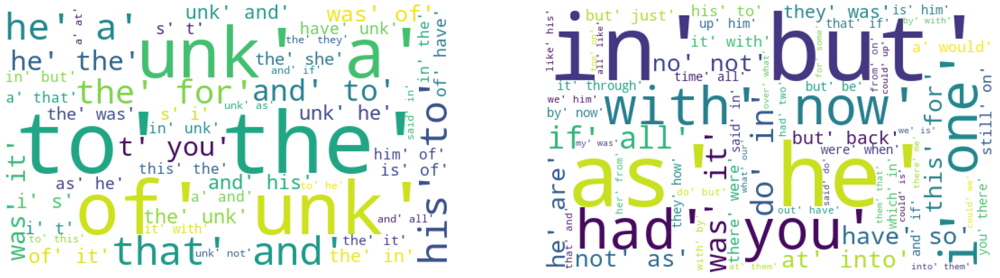

In [ ]:
test_unicode_word_preset_in_input_cloud = word_cloud(scifi_unicode_df[scifi_unicode_df.Data_Type=='test'].word_preset_in_input)          # predicted word present in input data word cloud
test_unicode_word_not_preset_in_input_cloud = word_cloud(scifi_unicode_df[scifi_unicode_df.Data_Type=='test'].word_not_preset_in_input)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(test_unicode_word_preset_in_input_cloud)
axs0.axis("off")
axs1.imshow(test_unicode_word_not_preset_in_input_cloud)
axs1.axis("off")

plt.show()

## Using Top 200k Vocab Words 

>> Trained the model using 200k vocab size and UnicodeScriptTokenizer

>> Observed to be after using 200k vocab size thee BLEU scores were not pretty compared to initial trained model using 20k vocab size

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.346448	0.145267	0.226396	0.309380

>> 80% of the scores were less than 0.4 and most of the scores lies between .2 and .5

    CDF ------------------------------------------------------- PDF ------------------------------------------------------- BoxPlot
![image](https://drive.google.com/uc?export=view&id=1uJMVr2oz0IImKdVv293GgJV21xp2aZ6s)


>> Most of the test input found to be in predicted data, decrease of model performance could be the reason that model is simple and it might increase the performance with complex model 

    Complete Data ------------------------------------------------ Test Input ------------------------------------------------ Test Predicted 
![image](https://drive.google.com/uc?export=view&id=11-o-KFLK7xX_PzY1OuSZRQmYDfmUnYUA)


### Data processing with 200k vocab size & UnicodeScriptTokenizer

In [ ]:
# with 200k vocab size & UnicodeScriptTokenizer
max_tokens = 200000
seq_len = 80
batch_size = 32
buffer_size = 1000


scifi_200k_vocab_unicode_tokenizer = tf_text.UnicodeScriptTokenizer()

scifi_200k_vocab_unicode_data, scifi_200k_vocab_unicode_vocab_table, scifi_200k_vocab_unicode_vocab_size = get_data_and_vocab_table('scifi_200k_vocab_unicode_data', scifi_200k_vocab_unicode_tokenizer, scifi_text_data['scifi_text'].values, max_tokens, seq_len, with_tfidf=False)

scifi_200k_vocab_unicode_train_dataset, scifi_200k_vocab_unicode_test_dataset = splitup_train_test(scifi_200k_vocab_unicode_data[1:-1], scifi_200k_vocab_unicode_tokenizer, scifi_200k_vocab_unicode_vocab_table, batch_size, buffer_size)


100%|██████████| 325298/325298 [00:00<00:00, 379551.25it/s]



Text split sequence - completed


Tokenization - completed



325298it [01:15, 4302.35it/s]


Full Vocab size:  273833
Filterd Vocab size:  199999

Construction of Vocab - completed



### Model Training

In [ ]:
model_200k_vocab_unicode_type = 'scifi_lstm_model_with_full_data_200k_vocab_unicode'

scifi_200k_vocab_unicode_lstm_model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=drive_path+f'{model_200k_vocab_unicode_type}.hdf5', save_weights_only=True, save_best_only=False)

scifi_200k_vocab_unicode_lstm_model = WordRNN(scifi_200k_vocab_unicode_vocab_size, embed_dim, maxlen, dropout, rnn_units, kernel_reg=None, use_lstm=True)

scifi_200k_vocab_unicode_lstm_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

scifi_200k_vocab_unicode_lstm_model.fit(scifi_200k_vocab_unicode_train_dataset, shuffle=True, epochs=5, validation_data=scifi_200k_vocab_unicode_test_dataset, callbacks=scifi_200k_vocab_unicode_lstm_model_checkpoint)


Epoch 1/5
8132/8132 [==============================] - 3653s 449ms/step - loss: 4.7976 - val_loss: 4.3609
Epoch 2/5
8132/8132 [==============================] - 3648s 449ms/step - loss: 4.2132 - val_loss: 4.1987
Epoch 3/5
8132/8132 [==============================] - 3652s 449ms/step - loss: 4.0317 - val_loss: 4.1412
Epoch 4/5
8132/8132 [==============================] - 3702s 455ms/step - loss: 3.9186 - val_loss: 4.1200
Epoch 5/5
8132/8132 [==============================] - 3650s 449ms/step - loss: 3.8368 - val_loss: 4.1143


In [ ]:
## load the model using trained weights

maxlen = 80
dropout = 0.2
rnn_units = 512
embed_dim = 256

scifi_200k_vocab_unicode_lstm_model = WordRNN(scifi_200k_vocab_unicode_vocab_size, embed_dim, maxlen, dropout, rnn_units, kernel_reg=None, use_lstm=True)

model_200k_vocab_unicode_type = 'scifi_lstm_model_with_full_data_200k_vocab_unicode'

scifi_200k_vocab_unicode_lstm_model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=drive_path+f'{model_200k_vocab_unicode_type}.hdf5', save_weights_only=True, save_best_only=False)

scifi_200k_vocab_unicode_lstm_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

for input_example_batch, target_example_batch in tqdm(scifi_200k_vocab_unicode_test_dataset.take(1)):
    pred = scifi_200k_vocab_unicode_lstm_model(input_example_batch)

scifi_200k_vocab_unicode_lstm_model.load_weights(drive_path+'scifi_lstm_model_with_full_data_200k_vocab_unicode.hdf5')


100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


In [24]:
scifi_200k_vocab_unicode_lstm_model.fit(scifi_200k_vocab_unicode_train_dataset, shuffle=True, initial_epoch=5, epochs=10, validation_data=scifi_200k_vocab_unicode_test_dataset, callbacks=scifi_200k_vocab_unicode_lstm_model_checkpoint)

Epoch 6/10
8132/8132 [==============================] - 3682s 453ms/step - loss: 3.8172 - val_loss: 4.1048
Epoch 7/10
8132/8132 [==============================] - 3673s 452ms/step - loss: 3.7389 - val_loss: 4.1135
Epoch 8/10
8132/8132 [==============================] - 3675s 452ms/step - loss: 3.6908 - val_loss: 4.1234
Epoch 9/10
8132/8132 [==============================] - 3677s 452ms/step - loss: 3.6524 - val_loss: 4.1327
Epoch 10/10
8132/8132 [==============================] - 3675s 452ms/step - loss: 3.6203 - val_loss: 4.1439


### Predictions with BLEU(1-4) Scores


In [25]:
scifi_200k_vocab_unicode_vocab_dict = get_vocab('scifi_200k_vocab_unicode_data', scifi_200k_vocab_unicode_vocab_table)
scifi_200k_vocab_unicode_id_lookup = {val: key for key, val in scifi_200k_vocab_unicode_vocab_dict.items()}
scifi_200k_vocab_data_type, scifi_200k_vocab_unicode_input, scifi_200k_vocab_unicode_target, scifi_200k_vocab_unicode_predicted, scifi_200k_vocab_unicode_BLEU1, scifi_200k_vocab_unicode_BLEU2, scifi_200k_vocab_unicode_BLEU3, scifi_200k_vocab_unicode_BLEU4 = [], [], [], [], [], [], [], []
model_type='lstm'

for data_type, data in {'test':scifi_200k_vocab_unicode_test_dataset}.items():
  for input_example_batch, target_example_batch in tqdm(data.as_numpy_iterator()):
    for idx in range(input_example_batch.shape[0]):
      if model_type=='lstm':
        # lstm will have both states hidden and cell
        predicted_logits, h_states, c_states = predict_one_step(scifi_200k_vocab_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      elif model_type=='gru':
        # gru will have only hidden state
        predicted_logits, h_states = predict_one_step(scifi_200k_vocab_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      elif model_type=='attention':
        # Attn model
        predicted_logits = predict_one_step(scifi_200k_vocab_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      predicted_indices = tf.random.categorical(predicted_logits[-1,:,:], num_samples=1)
      predicted_indices = tf.squeeze(predicted_indices, axis=-1).numpy()
      #print(input_example_batch[idx])
      scifi_200k_vocab_data_type.append(data_type)
      input_text = ' '.join([scifi_200k_vocab_unicode_id_lookup.get(id) for id in input_example_batch[idx] if id!=0 ])
      scifi_200k_vocab_unicode_input.append(input_text)
      target_text = ' '.join([scifi_200k_vocab_unicode_id_lookup.get(id) for id in target_example_batch[idx] if id!=0])
      scifi_200k_vocab_unicode_target.append(target_text)
      predicted_text = ' '.join([scifi_200k_vocab_unicode_id_lookup.get(id) for id in predicted_indices if id!=0])
      scifi_200k_vocab_unicode_predicted.append(predicted_text)
      scifi_200k_vocab_unicode_BLEU1.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(1, 0, 0, 0)))
      scifi_200k_vocab_unicode_BLEU2.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.5, .5, 0, 0)))
      scifi_200k_vocab_unicode_BLEU3.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.33, .33, .33, 0)))
      scifi_200k_vocab_unicode_BLEU4.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.25, .25, .25, .25)))


2033it [16:17,  2.08it/s]


In [26]:
scifi_200k_vocab_unicode_df = pd.DataFrame({'Data_Type': scifi_200k_vocab_data_type, 'Input':scifi_200k_vocab_unicode_input, 'Predicted':scifi_200k_vocab_unicode_predicted, 'BLEU-1':scifi_200k_vocab_unicode_BLEU1, 'BLEU-2':scifi_200k_vocab_unicode_BLEU2, 'BLEU-3':scifi_200k_vocab_unicode_BLEU3, 'BLEU-4':scifi_200k_vocab_unicode_BLEU4}).sort_values(['BLEU-1','BLEU-2','BLEU-3','BLEU-4'], ascending=False)

In [33]:
scifi_200k_vocab_unicode_df.head()

,Data_Type,Input,Predicted,BLEU-1,BLEU-2,BLEU-3,BLEU-4,common,word_preset_in_input,word_not_preset_in_input
16836,test,"mexico , south and central america and u . s . possessions . elsewhere . entered as secondclass matter at the post office , new york , n . y . copyright , new york , by galaxy publishing corporation , robert m . guinn , president . all rights , including translations reserved . ah material submitted must be accompanied by selfaddressed stamped envelopes . the publisher assumes no responsibility for unsolicited material . all stories printed in this magazine are fiction , and any similarity between characters and actual persons is coincidental . printed in the u . s . a .",". yellow and central america and u . s . possessions , elsewhere . secondclass as secondclass matter at the post office , new york , n . y . copyright , n york b july galaxy publishing corporation , robert m . guinn , president . all rights , including translations reserved . the material submitted must be accompanied by selfaddressed stamped envelopes . mavis publisher assumes no responsibility for unsolicited material . all stories printed in this magazine are fiction , and any similarity between characters and actual persons is coincidental . printed in the u . s . a . by",0.942308,0.897262,0.862757,0.832825,"{copyright, n, unsolicited, between, south, responsibility, magazine, for, july, galaxy, publisher, be, post, m, by, translations, submitted, robert, president, selfaddressed, new, fiction, the, assumes, secondclass, rights, publishing, coincidental, are, corporation, central, is, all, yellow, ,, possessions, and, reserved, material, ah, no, persons, a, entered, office, envelopes, characters, u, b, this, matter, must, mavis, similarity, actual, ., as, elsewhere, york, at, accompanied, america, stamped, mexico, printed, in, s, stories, any, guinn, y, including}","{copyright, n, unsolicited, between, responsibility, magazine, for, galaxy, publisher, be, post, m, translations, submitted, by, robert, president, selfaddressed, new, fiction, the, assumes, secondclass, rights, publishing, coincidental, are, corporation, central, is, all, possessions, ,, and, reserved, material, no, persons, a, office, envelopes, characters, u, this, matter, must, similarity, actual, ., york, as, elsewhere, at, accompanied, america, stamped, printed, in, s, stories, any, guinn, y, including}","{yellow, b, july, mavis}"
28981,test,"united states , canada , mexico , south and central america and u . s . possessions . elsewhere 4.50. entered as secondclass matter at the post office , new york , n . y . copyright , new york 1957, by galaxy publishing corporation , robert m . guinn , president . all rights , including translations reserved . all material submitted must be accompanied by selfaddressed stamped envelopes . the publisher assumes no responsibility for unsolicited material . all stories printed in this magazine are fiction , and any similarity between characters and actual persons is coincidental . printed","states is cal , mexico , south and central america and u . s . possessions . elsewhere . entered as secondclass matter at the post office , new york , n y y . copyright , new york by by galaxy publishing corporation . robert m . guinn , president . all rights , including translations reserved . all material submitted must be accompanied by selfaddressed stamped envelopes . the publisher assumes no responsibility for unsolicited material . every stories printed in this magazine are fiction , and any similarity between characters is actual persons is coincidental . printed in",0.920792,0.879469,0.845606,0.809640,"{copyright, n, unsolicited, between, south, responsibility, magazine, for, every, galaxy, publisher, be, post, m, by, states, translations, submitted, cal, robert, president, selfaddressed, new, fiction, the, assumes, secondclass, rights, publishing, coincidental, are, corporation, central, is, all, ,, possessions, and, reserved, material, 

### BLEU Scores

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.346448	0.145267	0.226396	0.309380


In [27]:
scifi_200k_vocab_unicode_df.describe()

,BLEU-1,BLEU-2,BLEU-3,BLEU-4
count,65056.000000,65056.000000,65056.000000,65056.000000
mean,0.346448,0.145267,0.226396,0.309380
std,0.058085,0.129022,0.148690,0.153288
min,0.095238,0.039409,0.035946,0.035151
25%,0.310000,0.082878,0.153947,0.241403
50%,0.344086,0.107299,0.202263,0.296978
75%,0.378947,0.140488,0.249054,0.347856
max,0.942308,0.897262,0.862757,0.832825


### Plotting BLEU Scores

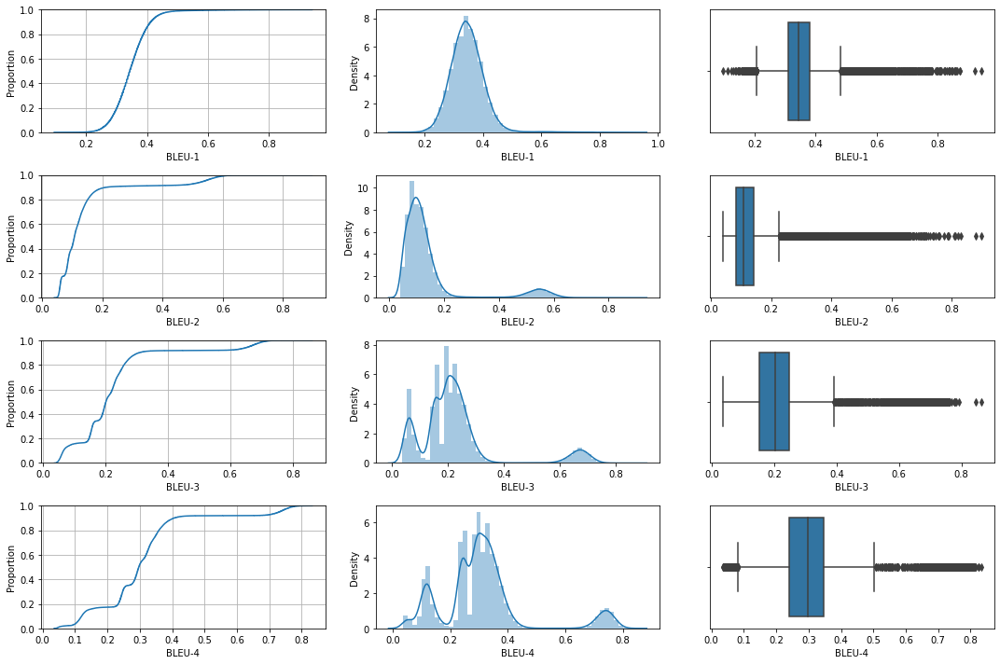

In [34]:
fig, axs = plt.subplots(4,3, figsize=(15,10))
sns.ecdfplot(scifi_200k_vocab_unicode_df['BLEU-1'], ax=axs[0,0])
axs[0,0].grid()
sns.distplot(scifi_200k_vocab_unicode_df['BLEU-1'], ax=axs[0,1])
sns.boxplot(scifi_200k_vocab_unicode_df['BLEU-1'], ax=axs[0,2])
sns.ecdfplot(scifi_200k_vocab_unicode_df['BLEU-2'], ax=axs[1,0])
axs[1,0].grid()
sns.distplot(scifi_200k_vocab_unicode_df['BLEU-2'], ax=axs[1,1])
sns.boxplot(scifi_200k_vocab_unicode_df['BLEU-2'], ax=axs[1,2])
sns.ecdfplot(scifi_200k_vocab_unicode_df['BLEU-3'], ax=axs[2,0])
axs[2,0].grid()
sns.distplot(scifi_200k_vocab_unicode_df['BLEU-3'], ax=axs[2,1])
sns.boxplot(scifi_200k_vocab_unicode_df['BLEU-3'], ax=axs[2,2])
sns.ecdfplot(scifi_200k_vocab_unicode_df['BLEU-4'], ax=axs[3,0])
axs[3,0].grid()
sns.distplot(scifi_200k_vocab_unicode_df['BLEU-4'], ax=axs[3,1])
sns.boxplot(scifi_200k_vocab_unicode_df['BLEU-4'], ax=axs[3,2])
plt.tight_layout()

### Creating Supporting Features

In [29]:
scifi_200k_vocab_unicode_vocab_keys = list(scifi_200k_vocab_unicode_vocab_dict.keys())

scifi_200k_vocab_unicode_df['common']=[set(x.split()+y.split()) for x, y in tqdm(scifi_200k_vocab_unicode_df[['Input','Predicted']].values)]
scifi_200k_vocab_unicode_df['word_preset_in_input']=[set([i for i in y.split() if i in x.split()]) for x, y in tqdm(scifi_200k_vocab_unicode_df[['Input','Predicted']].values)]
scifi_200k_vocab_unicode_df['word_not_preset_in_input']=[set([i for i in y.split() if i not in x.split()]) for x, y in tqdm(scifi_200k_vocab_unicode_df[['Input','Predicted']].values)]


100%|██████████| 65056/65056 [00:28<00:00, 2244.82it/s]


### Word Cloud - Plotting

100%|██████████| 65056/65056 [00:01<00:00, 49918.84it/s]


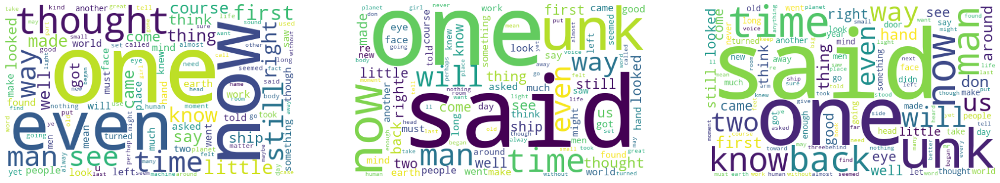

In [30]:
scifi_200k_vocab_unicode_text_word_cloud = word_cloud(scifi_text_data['scifi_text']) # overall dataset word cloud
train_200k_vocab_unicode_word_input = word_cloud(scifi_200k_vocab_unicode_df.Input)          # predicted word present in input data word cloud
train_200k_vocab_unicode_word_predicted = word_cloud(scifi_200k_vocab_unicode_df.Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(scifi_200k_vocab_unicode_text_word_cloud)
axs0.axis("off")
axs1.imshow(train_200k_vocab_unicode_word_input)
axs1.axis("off")
axs2.imshow(train_200k_vocab_unicode_word_predicted)
axs2.axis("off")

plt.show()

100%|██████████| 65056/65056 [00:01<00:00, 55462.04it/s]


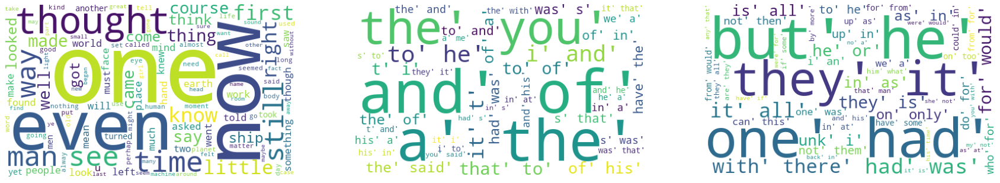

In [32]:
#scifi_200k_vocab_unicode_text_word_cloud = word_cloud(scifi_text_data['scifi_text']) # overall dataset word cloud
train_200k_vocab_unicode_word_preset_in_input_cloud = word_cloud(scifi_200k_vocab_unicode_df.word_preset_in_input)          # predicted word present in input data word cloud
train_200k_vocab_unicode_word_not_preset_in_input_cloud = word_cloud(scifi_200k_vocab_unicode_df.word_not_preset_in_input)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(scifi_200k_vocab_unicode_text_word_cloud)
axs0.axis("off")
axs1.imshow(train_200k_vocab_unicode_word_preset_in_input_cloud)
axs1.axis("off")
axs2.imshow(train_200k_vocab_unicode_word_not_preset_in_input_cloud)
axs2.axis("off")

plt.show()

## Using Sequence Length as 20

>> Trained the model with same 20k vocab, Unicode, but changed the input sequence length to 20 from 80

>> Observed to be loss & val_loss got reduced but the BLEU scores was not better than with sequence length 80

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.244780	0.337720	0.461685	0.545464

>> 80% of the scores were less than 0.4 and most of the scores lies between .2 and.5

    CDF ------------------------------------------------------- PDF ------------------------------------------------------- BoxPlot
![image](https://drive.google.com/uc?export=view&id=1vQlK6_hHK1GVlBQ2fP5wKa6OLq6fbyon)

>> Most of the test input found be UNK, could be the reason for low performance during model training

    Complete Data ------------------------------------------------ Test Input ------------------------------------------------ Test Predicted 
![image](https://drive.google.com/uc?export=view&id=1XUOmbSv9FIio1CWTVJ_j2EYUgyjtHzmz)


### Data processing with UnicodeScriptTokenizer

In [ ]:
# with UnicodeScriptTokenizer
seq_len = 20
max_tokens = 20000
batch_size = 32
buffer_size = 1000

scifi_20_seq_len_unicode_tokenizer = tf_text.UnicodeScriptTokenizer()

scifi_20_seq_len_unicode_data, scifi_20_seq_len_unicode_vocab_table, scifi_20_seq_len_unicode_vocab_size = get_data_and_vocab_table('scifi_20_seq_len_unicode_data', scifi_20_seq_len_unicode_tokenizer, scifi_text_data['scifi_text'].values, max_tokens, seq_len)

scifi_20_seq_len_unicode_train_dataset, scifi_20_seq_len_unicode_test_dataset = splitup_train_test(scifi_20_seq_len_unicode_data[1:-1], scifi_20_seq_len_unicode_tokenizer, scifi_20_seq_len_unicode_vocab_table, batch_size, buffer_size)


100%|██████████| 1254720/1254720 [00:01<00:00, 879485.12it/s]



Text split sequence - completed


Tokenization - completed



1254720it [04:22, 4777.11it/s]


Full Vocab size:  273825
Filterd Vocab size:  19999

Construction of Vocab - completed



### Model Training

In [ ]:
model_unicode_type = 'scifi_20_seq_len_lstm_model_with_full_data_unicode_20k_vocab_size'

scifi_20_seq_len_unicode_lstm_model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=drive_path+f'{model_unicode_type}.hdf5', save_weights_only=True, save_best_only=False)

scifi_20_seq_len_unicode_lstm_model = WordRNN(scifi_20_seq_len_unicode_vocab_size, embed_dim, maxlen, dropout, rnn_units, kernel_reg=None, use_lstm=True)

scifi_20_seq_len_unicode_lstm_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

scifi_20_seq_len_unicode_lstm_model.fit(scifi_20_seq_len_unicode_train_dataset, shuffle=True, epochs=10, validation_data=scifi_20_seq_len_unicode_test_dataset, callbacks=scifi_20_seq_len_unicode_lstm_model_checkpoint)


Epoch 1/10
31367/31367 [==============================] - 705s 22ms/step - loss: 3.8576 - val_loss: 3.6469
Epoch 2/10
31367/31367 [==============================] - 678s 22ms/step - loss: 3.6066 - val_loss: 3.5772
Epoch 3/10
31367/31367 [==============================] - 679s 22ms/step - loss: 3.5412 - val_loss: 3.5545
Epoch 4/10
31367/31367 [==============================] - 680s 22ms/step - loss: 3.5089 - val_loss: 3.5445
Epoch 5/10
31367/31367 [==============================] - 679s 22ms/step - loss: 3.4891 - val_loss: 3.5388
Epoch 6/10
31367/31367 [==============================] - 679s 22ms/step - loss: 3.4757 - val_loss: 3.5355
Epoch 7/10
31367/31367 [==============================] - 679s 22ms/step - loss: 3.4659 - val_loss: 3.5324
Epoch 8/10
31367/31367 [==============================] - 679s 22ms/step - loss: 3.4581 - val_loss: 3.5304
Epoch 9/10
31367/31367 [==============================] - 678s 22ms/step - loss: 3.4517 - val_loss: 3.5291
Epoch 10/10
31367/31367 [============

In [ ]:
## load the model using trained weights

maxlen = 80
dropout = 0.2
rnn_units = 512
embed_dim = 256

scifi_unicode_lstm_model = WordRNN(scifi_unicode_vocab_size, embed_dim, maxlen, dropout, rnn_units, kernel_reg=None, use_lstm=True)

for input_example_batch, target_example_batch in tqdm(scifi_unicode_test_dataset.take(1)):
    pred = scifi_unicode_lstm_model(input_example_batch)

scifi_unicode_lstm_model.load_weights(drive_path+'scifi_lstm_model_with_full_data_unicode_20k_vocab_size.hdf5')


100%|██████████| 1/1 [00:03<00:00,  3.03s/it]


### Predictions with BLEU(1-4) Scores

In [ ]:
scifi_20_seq_len_unicode_vocab_dict = get_vocab('scifi_20_seq_len_unicode_data', scifi_20_seq_len_unicode_vocab_table)
scifi_20_seq_len_unicode_id_lookup = {val: key for key, val in scifi_20_seq_len_unicode_vocab_dict.items()}
scifi_20_seq_len_data_type, scifi_20_seq_len_unicode_input, scifi_20_seq_len_unicode_target, scifi_20_seq_len_unicode_predicted, scifi_20_seq_len_unicode_BLEU1, scifi_20_seq_len_unicode_BLEU2, scifi_20_seq_len_unicode_BLEU3, scifi_20_seq_len_unicode_BLEU4 = [], [], [], [], [], [], [], []
model_type='lstm'

for data_type, data in {'test':scifi_20_seq_len_unicode_test_dataset}.items():
  for input_example_batch, target_example_batch in tqdm(data.as_numpy_iterator()):
    for idx in range(input_example_batch.shape[0]):
      if model_type=='lstm':
        # lstm will have both states hidden and cell
        predicted_logits, h_states, c_states = predict_one_step(scifi_20_seq_len_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      elif model_type=='gru':
        # gru will have only hidden state
        predicted_logits, h_states = predict_one_step(scifi_20_seq_len_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      elif model_type=='attention':
        # Attn model
        predicted_logits = predict_one_step(scifi_20_seq_len_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      predicted_indices = tf.random.categorical(predicted_logits[-1,:,:], num_samples=1)
      predicted_indices = tf.squeeze(predicted_indices, axis=-1).numpy()
      #print(input_example_batch[idx])
      scifi_20_seq_len_data_type.append(data_type)
      input_text = ' '.join([scifi_20_seq_len_unicode_id_lookup.get(id) for id in input_example_batch[idx] if id!=0 ])
      scifi_20_seq_len_unicode_input.append(input_text)
      target_text = ' '.join([scifi_20_seq_len_unicode_id_lookup.get(id) for id in target_example_batch[idx] if id!=0])
      scifi_20_seq_len_unicode_target.append(target_text)
      predicted_text = ' '.join([scifi_20_seq_len_unicode_id_lookup.get(id) for id in predicted_indices if id!=0])
      scifi_20_seq_len_unicode_predicted.append(predicted_text)
      scifi_20_seq_len_unicode_BLEU1.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(1, 0, 0, 0)))
      scifi_20_seq_len_unicode_BLEU2.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.5, .5, 0, 0)))
      scifi_20_seq_len_unicode_BLEU3.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.33, .33, .33, 0)))
      scifi_20_seq_len_unicode_BLEU4.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.25, .25, .25, .25)))


7842it [36:24,  3.59it/s]


In [ ]:
scifi_20_seq_len_unicode_df = pd.DataFrame({'Data_Type': scifi_20_seq_len_data_type, 'Input':scifi_20_seq_len_unicode_input, 'Predicted':scifi_20_seq_len_unicode_predicted, 'BLEU-1':scifi_20_seq_len_unicode_BLEU1, 'BLEU-2':scifi_20_seq_len_unicode_BLEU2, 'BLEU-3':scifi_20_seq_len_unicode_BLEU3, 'BLEU-4':scifi_20_seq_len_unicode_BLEU4}).sort_values(['BLEU-1','BLEU-2','BLEU-3','BLEU-4'], ascending=False)

In [ ]:
scifi_20_seq_len_unicode_df.head()

,Data_Type,Input,Predicted,BLEU-1,BLEU-2,BLEU-3,BLEU-4,common,word_preset_in_input,word_not_preset_in_input
22346,test,"unsolicited material . all stories printed in this magazine are fiction , and any similarity between characters and actual persons is coincidental .","material . all stories printed in this magazine are fiction , and any similarity between characters and actual persons is coincidental . title",0.956522,0.955533,0.954926,0.953359,"{fiction, and, coincidental, are, similarity, any, characters, actual, ,, stories, title, material, between, printed, all, ., unsolicited, persons, this, in, is, magazine}","{fiction, and, coincidental, are, similarity, any, characters, actual, ,, stories, material, between, printed, all, ., persons, this, in, is, magazine}",{title}
172273,test,translations reserved . all material submitted must be accompanied by selfaddressed stamped envelopes . the publisher assumes no responsibility for unsolicited material .,reserved . all material submitted must be accompanied by selfaddressed stamped envelopes . the publisher assumes no responsibility for unsolicited material . all,0.956522,0.955533,0.954926,0.953359,"{publisher, submitted, accompanied, selfaddressed, no, responsibility, translations, envelopes, be, material, by, assumes, reserved, for, all, ., unsolicited, must, stamped, the}","{publisher, submitted, accompanied, selfaddressed, no, responsibility, envelopes, be, material, by, assumes, reserved, for, all, ., unsolicited, must, stamped, the}",{}
193847,test,"envelopes . the publisher assumes no responsibility for unsolicited material . all stories printed in this magazine are fiction , and any similarity",". the publisher assumes no responsibility for unsolicited material . all stories printed in this magazine are fiction , and any similarity between",0.956522,0.955533,0.954926,0.953359,"{publisher, the, fiction, and, are, similarity, no, responsibility, any, ,, stories, envelopes, material, assumes, between, printed, for, all, ., unsolicited, this, in, magazine}","{publisher, the, fiction, and, are, similarity, no, responsibility, any, ,, stories, material, assumes, printed, for, all, ., unsolicited, this, in, magazine}",{between}
207313,test,corollary of finagle ' s general law of dynamic negatives says no books are ever lost by loaning except ones you particularly,of finagle ' s general law of dynamic negatives says no books are ever lost by loaning except ones you particularly want,0.954545,0.953463,0.952772,0.951070,"{law, ever, dynamic, ones, are, except, no, particularly, corollary, want, of, negatives, says, by, lost, loaning, s, finagle, books, general, ', you}","{law, ever, dynamic, ones, are, except, no, particularly, of, negatives, says, by, lost, loaning, s, finagle, books, general, ', you}",{want}
107389,test,"subscriptions copies per year in the united states , canada , mexico , south and central america and u . s . possessions . elsewhere . entered","but per year in the united states , canada , mexico , south and central america and u . s . possessions . elsewhere . entered as",0.925926,0.924500,0.923738,0.921411,"{central, and, as, copies, year, possessions, u, ,, subscriptions, per, south, s, states, ., canada, america, elsewhere, mexico, entered, united, but, in, the}","{central, and, year, possessions, u, ,, per, south, s, states, ., elsewhere, america, canada, mexico, entered, united, in, the}","{but, as}"


In [ ]:
scifi_20_seq_len_unicode_df.tail()

,Data_Type,Input,Predicted,BLEU-1,BLEU-2,BLEU-3,BLEU-4,common,word_preset_in_input,word_not_preset_in_input
248058,test,common ancestor with the pig had better trade with earthmen on their terms on any terms if they hoped to,"cooking and UNK UNK ' managed than and UNK . mouths way , earth further . you were at get",0.0,0.0,0.0,0.0,"{ancestor, mouths, and, at, if, on, with, managed, earthmen, way, had, common, any, they, ,, than, to, further, UNK, earth, get, their, terms, ., were, trade, better, hoped, pig, ', cooking, you, the}",{},"{were, mouths, and, UNK, earth, further, way, at, get, ', cooking, managed, ,, you, ., than}"
248103,test,machine than to handle department store complaints but pleasing a customer should have its limits t he christmas party at,. i serve things ' no never didn things week sees wonder been usual . . farmers day had their,0.0,0.0,0.0,0.0,"{machine, department, things, sees, day, at, party, didn, wonder, handle, no, had, farmers, customer, have, complaints, never, a, serve, he, than, pleasing, t, to, week, their, its, ., been, christmas, should, i, usual, limits, but, ', store}",{},"{no, been, had, farmers, things, i, sees, usual, day, week, their, never, ', serve, didn, wonder, .}"
249867,test,is a mind where is the interaction point between mind and body is the mind also soul is the soul,"sick man klara outstretched that source of , our . purposes , mine meaning potential mammalian world your only of",0.0,0.0,0.0,0.0,"{and, outstretched, mind, world, potential, meaning, source, only, that, our, your, klara, a, of, ,, mine, body, between, sick, also, soul, mammalian, interaction, purposes, ., point, where, is, man, the}",{},"{source, mammalian, sick, only, that, our, outstretched, ., your, meaning, ,, klara, potential, world, of, purposes, mine, man}"
250335,test,galaxy a clue to its purpose why was there only one entrance to such a huge construction did the physics,", martian about your existence on UNK mary crumpled an solid that safety fort sense city slug you men grapple",0.0,0.0,0.0,0.0,"{entrance, about, sense, on, crumpled, one, clue, existence, only, men, mary, that, your, was, martian, slug, a, grapple, ,, why, an, purpose, to, solid, UNK, construction, safety, huge, its, galaxy, fort, city, physics, there, such, you, did, the}",{},"{about, sense, on, crumpled, existence, men, mary, that, your, slug, martian, grapple, ,, an, solid, UNK, safety, fort, city, you}"
250512,test,had made friends with a half dozen of the UNK creatures and looked forward to UNK old acquaintances . but almost,"drawn his , him lonely grown members his rest just in came humanoid that brace time stories on he just everything",0.0,0.0,0.0,0.0,"{everything, old, and, friends, creatures, with, grown, him, acquaintances, in, on, came, had, dozen, rest, that, time, members, almost, a, of, ,, he, his, stories, just, to, lonely, UNK, brace, forward, drawn, ., looked, but, humanoid, half, made, the}",{},"{everything, on, grown, him, came, rest, that, time, members, he, ,, his, stories, just, lonely, brace, drawn, humanoid, in}"


### BLEU Scores

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.244780	0.337720	0.461685	0.545464


In [ ]:
scifi_20_seq_len_unicode_df.describe()

,BLEU-1,BLEU-2,BLEU-3,BLEU-4
count,250944.000000,250944.000000,250944.000000,250944.000000
mean,0.244780,0.337720,0.461685,0.545464
std,0.089819,0.172883,0.185646,0.178406
min,0.000000,0.000000,0.000000,0.000000
25%,0.181818,0.133366,0.247275,0.346305
50%,0.240000,0.387298,0.534700,0.620403
75%,0.300000,0.480384,0.616380,0.693098
max,0.956522,0.955533,0.954926,0.953359


### Plotting BLEU Scores

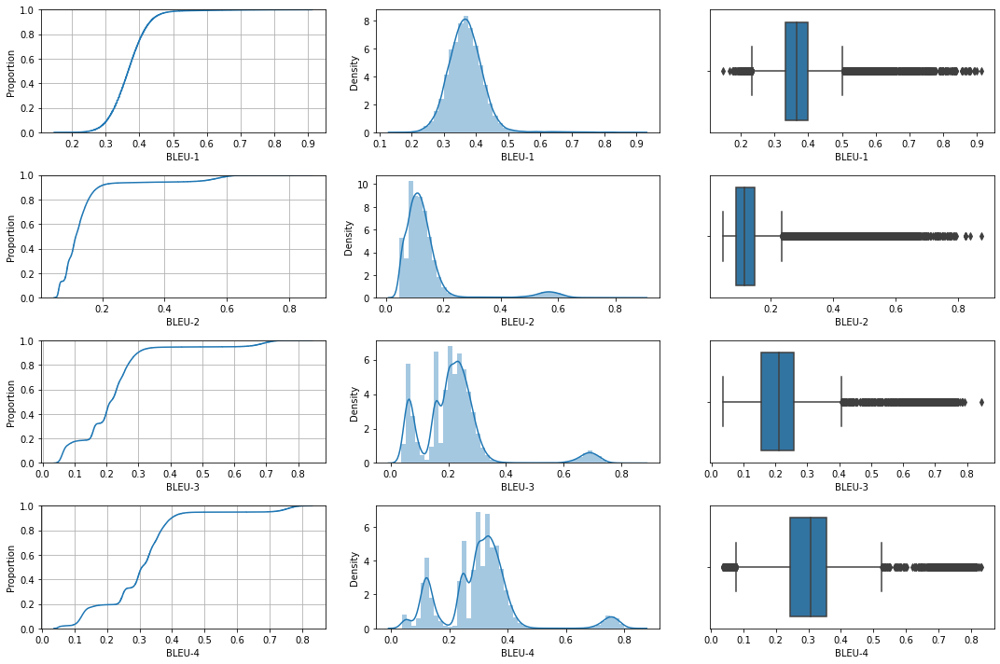

In [ ]:
fig, axs = plt.subplots(4,3, figsize=(15,10))
sns.ecdfplot(scifi_20_seq_len_unicode_df['BLEU-1'], ax=axs[0,0])
axs[0,0].grid()
sns.distplot(scifi_20_seq_len_unicode_df['BLEU-1'], ax=axs[0,1])
sns.boxplot(scifi_20_seq_len_unicode_df['BLEU-1'], ax=axs[0,2])
sns.ecdfplot(scifi_20_seq_len_unicode_df['BLEU-2'], ax=axs[1,0])
axs[1,0].grid()
sns.distplot(scifi_20_seq_len_unicode_df['BLEU-2'], ax=axs[1,1])
sns.boxplot(scifi_20_seq_len_unicode_df['BLEU-2'], ax=axs[1,2])
sns.ecdfplot(scifi_20_seq_len_unicode_df['BLEU-3'], ax=axs[2,0])
axs[2,0].grid()
sns.distplot(scifi_20_seq_len_unicode_df['BLEU-3'], ax=axs[2,1])
sns.boxplot(scifi_20_seq_len_unicode_df['BLEU-3'], ax=axs[2,2])
sns.ecdfplot(scifi_20_seq_len_unicode_df['BLEU-4'], ax=axs[3,0])
axs[3,0].grid()
sns.distplot(scifi_20_seq_len_unicode_df['BLEU-4'], ax=axs[3,1])
sns.boxplot(scifi_20_seq_len_unicode_df['BLEU-4'], ax=axs[3,2])
plt.tight_layout()

### Creating Supporting Features

In [ ]:
scifi_20_seq_len_unicode_vocab_keys = list(scifi_20_seq_len_unicode_vocab_dict.keys())

scifi_20_seq_len_unicode_df['common']=[set(x.split()+y.split()) for x, y in scifi_20_seq_len_unicode_df[['Input','Predicted']].values]
scifi_20_seq_len_unicode_df['word_preset_in_input']=[set([i for i in y.split() if i in x.split()]) for x, y in scifi_20_seq_len_unicode_df[['Input','Predicted']].values]
scifi_20_seq_len_unicode_df['word_not_preset_in_input']=[set([i for i in y.split() if i not in x.split()]) for x, y in scifi_20_seq_len_unicode_df[['Input','Predicted']].values]


In [ ]:
def create_dict(values):
  predicted_dict = collections.defaultdict(lambda: 0)
  for toks in tqdm(values):
      for tok in toks.split():
        predicted_dict[tok] += 1
  vocab = [tok for tok, val in sorted(predicted_dict.items(), key=lambda x: x[1], reverse=True)]
  return vocab

In [ ]:
#best = create_dict(scifi_unicode_df[scifi_unicode_df['BLEU-1']>.50]['Predicted'].values)
best[-20:]

['starter',
 'penny',
 'conceal',
 'mantle',
 'alarmed',
 'stake',
 'lolling',
 'ballod',
 'sly',
 'elated',
 'sliced',
 'horrified',
 'penelope',
 'whitey',
 'thereby',
 'linked',
 'chopping',
 'ekstrohm',
 'consists',
 'dimensional']

In [ ]:
#worst = create_dict(scifi_unicode_df[scifi_unicode_df['BLEU-1']<.50]['Predicted'].values)
worst[-20:]

['grime',
 'teu',
 'cade',
 'tokay',
 'guerrilla',
 'secondclass',
 'hildemar',
 'gf',
 'mgr',
 'helpfulness',
 'attune',
 'braille',
 'tunick',
 'mortgages',
 'loaning',
 'rapp',
 'inl',
 'finagle',
 'lynd',
 'panamerican']

### Word Cloud - Plotting


100%|██████████| 250944/250944 [00:01<00:00, 159684.93it/s]


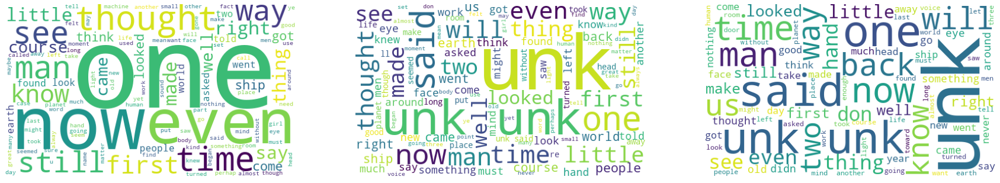

In [ ]:
scifi_unicode_text_word_cloud = word_cloud(scifi_text_data['scifi_text']) # overall dataset word cloud
train_unicode_word_input = word_cloud(scifi_20_seq_len_unicode_df.Input)          # predicted word present in input data word cloud
train_unicode_word_predicted = word_cloud(scifi_20_seq_len_unicode_df.Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(scifi_unicode_text_word_cloud)
axs0.axis("off")
axs1.imshow(train_unicode_word_input)
axs1.axis("off")
axs2.imshow(train_unicode_word_predicted)
axs2.axis("off")

plt.show()

100%|██████████| 260224/260224 [00:04<00:00, 57377.12it/s]


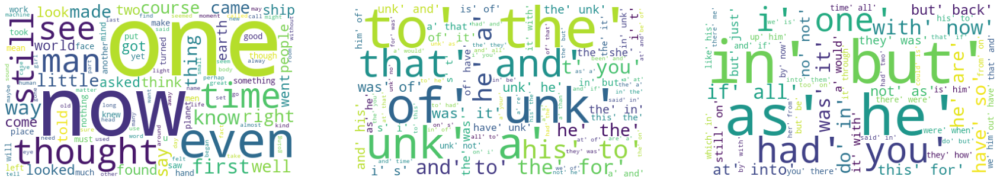

In [ ]:
#scifi_20_seq_len_unicode_text_word_cloud = word_cloud(scifi_20_seq_len_text_data['scifi_20_seq_len_text']) # overall dataset word cloud
train_unicode_word_preset_in_input_cloud = word_cloud(scifi_20_seq_len_unicode_df.word_preset_in_input)          # predicted word present in input data word cloud
train_unicode_word_not_preset_in_input_cloud = word_cloud(scifi_20_seq_len_unicode_df.word_not_preset_in_input)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(scifi_20_seq_len_unicode_text_word_cloud)
axs0.axis("off")
axs1.imshow(train_unicode_word_preset_in_input_cloud)
axs1.axis("off")
axs2.imshow(train_unicode_word_not_preset_in_input_cloud)
axs2.axis("off")

plt.show()

100%|██████████| 1772/1772 [00:00<00:00, 166085.07it/s]


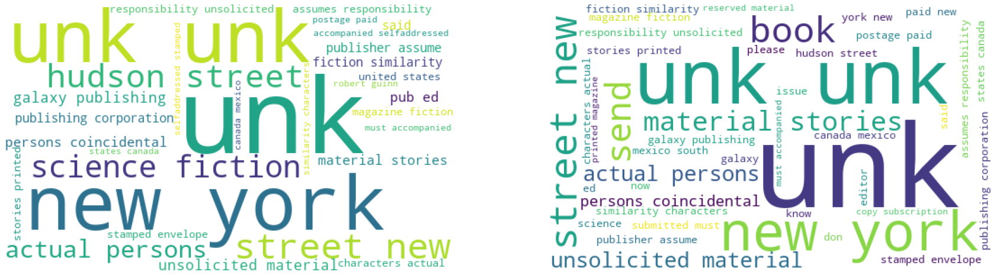

In [ ]:
test_unicode_word_input = word_cloud(scifi_20_seq_len_unicode_df[(scifi_20_seq_len_unicode_df['BLEU-1']>.50)].Input)          # predicted word present in input data word cloud
test_unicode_word_predicted = word_cloud(scifi_20_seq_len_unicode_df[(scifi_20_seq_len_unicode_df['BLEU-1']>.50)].Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(test_unicode_word_input)
axs0.axis("off")
axs1.imshow(test_unicode_word_predicted)
axs1.axis("off")

plt.show()

100%|██████████| 8900/8900 [00:00<00:00, 159747.45it/s]


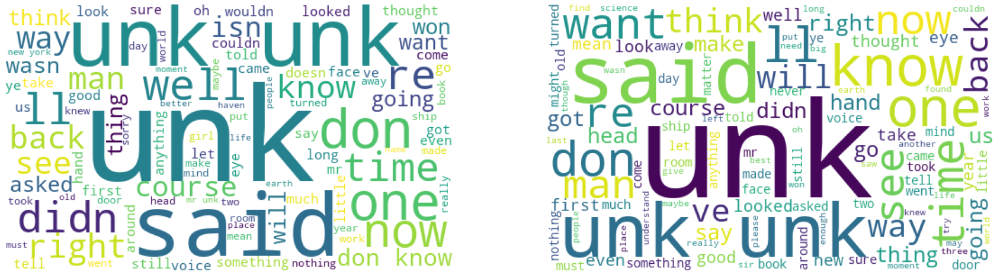

In [ ]:
test_unicode_word_input = word_cloud(scifi_20_seq_len_unicode_df[(scifi_20_seq_len_unicode_df['BLEU-1']>=.40) & (scifi_20_seq_len_unicode_df['BLEU-1']<=.50)].Input)          # predicted word present in input data word cloud
test_unicode_word_predicted = word_cloud(scifi_20_seq_len_unicode_df[(scifi_20_seq_len_unicode_df['BLEU-1']>=.40) & (scifi_20_seq_len_unicode_df['BLEU-1']<=.50)].Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(test_unicode_word_input)
axs0.axis("off")
axs1.imshow(test_unicode_word_predicted)
axs1.axis("off")

plt.show()

100%|██████████| 240272/240272 [00:01<00:00, 160096.55it/s]


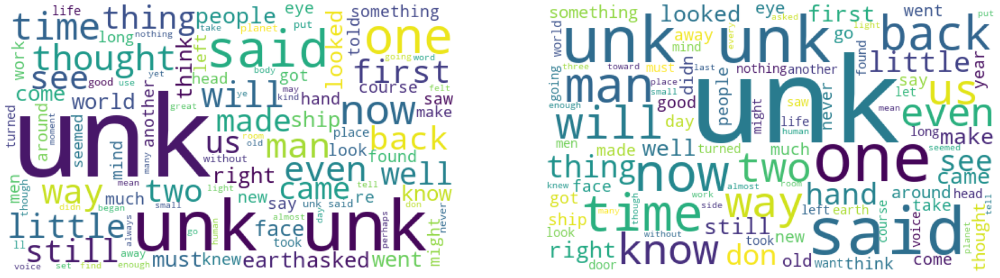

In [ ]:
test_unicode_word_input = word_cloud(scifi_20_seq_len_unicode_df[(scifi_20_seq_len_unicode_df['BLEU-1']<0.40)].Input)          # predicted word present in input data word cloud
test_unicode_word_predicted = word_cloud(scifi_20_seq_len_unicode_df[(scifi_20_seq_len_unicode_df['BLEU-1']<0.40)].Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(test_unicode_word_input)
axs0.axis("off")
axs1.imshow(test_unicode_word_predicted)
axs1.axis("off")

plt.show()

100%|██████████| 384/384 [00:00<00:00, 180724.05it/s]


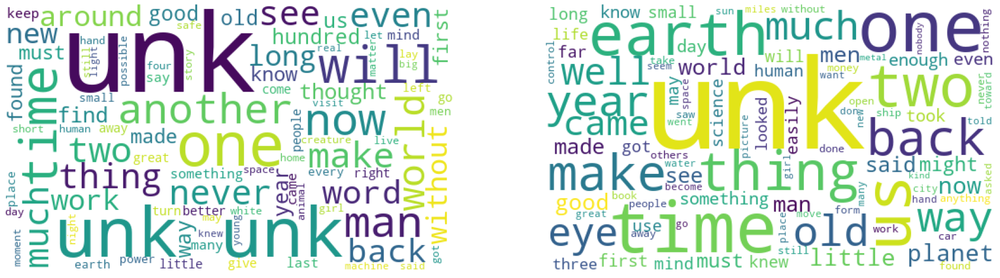

In [ ]:
test_unicode_word_input = word_cloud(scifi_20_seq_len_unicode_df[(scifi_20_seq_len_unicode_df['BLEU-1']==0.00)].Input)          # predicted word present in input data word cloud
test_unicode_word_predicted = word_cloud(scifi_20_seq_len_unicode_df[(scifi_20_seq_len_unicode_df['BLEU-1']==0.00)].Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1) = plt.subplots(1,2, figsize = (30, 20), facecolor = None)
axs0.imshow(test_unicode_word_input)
axs0.axis("off")
axs1.imshow(test_unicode_word_predicted)
axs1.axis("off")

plt.show()

## Data Split Good-Medium-Worst using BLEU-1 Score

To understand the data behavior with low BLEU-1 scores, so I have chosen the best model which is having good BLUE scores found during debugging process and done the split with below ratio

>> Good - with BLEU-1 is >= 0.50 (4541 data points)

>> Medium - with BLEU-1 is > 0.4 and < 0.5 (66205 data points)

>> Worst - with BLEU-1 is <= 0.40 (189478 data points)

Using **Worst** data points, generated separate vocabulary and trained the model independently with same 20k vocab, input sequence length as 80 and UnicodeScriptTokenizer

>> Observed the model output was to be same like earlier

    BLEU-1	  BLEU-2	  BLEU-3	  BLEU-4
    0.366834	0.142819	0.224909	0.310138

>> 80% of the scores were less than 0.4 and most of the scores lies between .2 and .5

    CDF ------------------------------------------------------- PDF ------------------------------------------------------- BoxPlot
![image](https://drive.google.com/uc?export=view&id=1CePXSsWVV4pGULKVowJLr4tE8dZR-pW-)

>> Most of the test input & predicted was found to be UNK

    Complete Data ------------------------------------------------ Test Input ------------------------------------------------ Test Predicted 
![image](https://drive.google.com/uc?export=view&id=16SE0oRMQVGA8eMFRQcAn6vN765MifYGs)


In [ ]:
train = scifi_unicode_df[scifi_unicode_df.Data_Type=='train'][['BLEU-1']]

In [ ]:
worst_data_indices = list(train[train['BLEU-1']<=0.40].index)
len(worst_data_indices)

189478

In [ ]:
medium_data_indices = list(train[(train['BLEU-1']>0.40)&(train['BLEU-1']<0.50)].index)
len(medium_data_indices)

66205

In [ ]:
good_data_indices = list(train[(train['BLEU-1']>=0.50)].index)
len(good_data_indices)

4541

In [ ]:
scifi_unicode_data = np.array(scifi_unicode_data)

In [ ]:
worst_data_points = scifi_unicode_data[worst_data_indices]
len(worst_data_points)

189478

In [ ]:
# creating seperate vocabulary to check wether the issue is with voab size or the data issue
seq_len = 80
max_tokens = 20000
batch_size = 32
buffer_size = 1000

worst_unicode_tokenizer = tf_text.UnicodeScriptTokenizer()

worst_unicode_data, worst_unicode_vocab_table, worst_unicode_vocab_size = get_data_and_vocab_table('worst_unicode_data', worst_unicode_tokenizer, worst_data_points, max_tokens, seq_len)

worst_unicode_train_dataset, worst_unicode_test_dataset = splitup_train_test(worst_unicode_data, worst_unicode_tokenizer, worst_unicode_vocab_table, batch_size, buffer_size)


100%|██████████| 189478/189478 [00:00<00:00, 387508.28it/s]



Text split sequence - completed


Tokenization - completed



189478it [00:42, 4430.44it/s]


Full Vocab size:  201177
Filterd Vocab size:  19999

Construction of Vocab - completed



In [ ]:
model_unicode_type = 'worst_lstm_model_with_full_data_unicode_20k_vocab_size'

worst_unicode_lstm_model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=drive_path+f'{model_unicode_type}.hdf5', save_weights_only=True, save_best_only=False)

worst_unicode_lstm_model = WordRNN(worst_unicode_vocab_size, embed_dim, maxlen, dropout, rnn_units, kernel_reg=None, use_lstm=True)

worst_unicode_lstm_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

worst_unicode_lstm_model.fit(worst_unicode_train_dataset, shuffle=True, epochs=10, validation_data=worst_unicode_test_dataset, callbacks=worst_unicode_lstm_model_checkpoint)


Epoch 1/10
4736/4736 [==============================] - 310s 65ms/step - loss: 4.5850 - val_loss: 4.2347
Epoch 2/10
4736/4736 [==============================] - 303s 64ms/step - loss: 4.1238 - val_loss: 4.0715
Epoch 3/10
4736/4736 [==============================] - 303s 64ms/step - loss: 3.9825 - val_loss: 3.9987
Epoch 4/10
4736/4736 [==============================] - 303s 64ms/step - loss: 3.8929 - val_loss: 3.9548
Epoch 5/10
4736/4736 [==============================] - 303s 64ms/step - loss: 3.8264 - val_loss: 3.9286
Epoch 6/10
4736/4736 [==============================] - 304s 64ms/step - loss: 3.7744 - val_loss: 3.9128
Epoch 7/10
4736/4736 [==============================] - 305s 64ms/step - loss: 3.7318 - val_loss: 3.9034
Epoch 8/10
4736/4736 [==============================] - 306s 65ms/step - loss: 3.6966 - val_loss: 3.8987
Epoch 9/10
4736/4736 [==============================] - 305s 64ms/step - loss: 3.6670 - val_loss: 3.8972
Epoch 10/10
4736/4736 [==============================] 

In [ ]:
worst_unicode_vocab_dict = get_vocab('worst_unicode_data', worst_unicode_vocab_table)
worst_unicode_id_lookup = {val: key for key, val in worst_unicode_vocab_dict.items()}
worst_data_type, worst_unicode_input, worst_unicode_target, worst_unicode_predicted, worst_unicode_BLEU1, worst_unicode_BLEU2, worst_unicode_BLEU3, worst_unicode_BLEU4 = [], [], [], [], [], [], [], []
model_type='lstm'

for data_type, data in {'test':worst_unicode_test_dataset}.items():
  for input_example_batch, target_example_batch in tqdm(data.as_numpy_iterator()):
    for idx in range(input_example_batch.shape[0]):
      if model_type=='lstm':
        # lstm will have both states hidden and cell
        predicted_logits, h_states, c_states = predict_one_step(worst_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      elif model_type=='gru':
        # gru will have only hidden state
        predicted_logits, h_states = predict_one_step(worst_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      elif model_type=='attention':
        # Attn model
        predicted_logits = predict_one_step(worst_unicode_lstm_model, input_example_batch[idx], model_type, h_states=None, c_states=None)
      predicted_indices = tf.random.categorical(predicted_logits[-1,:,:], num_samples=1)
      predicted_indices = tf.squeeze(predicted_indices, axis=-1).numpy()
      #print(input_example_batch[idx])
      worst_data_type.append(data_type)
      input_text = ' '.join([worst_unicode_id_lookup.get(id) for id in input_example_batch[idx] if id!=0 ])
      worst_unicode_input.append(input_text)
      target_text = ' '.join([worst_unicode_id_lookup.get(id) for id in target_example_batch[idx] if id!=0])
      worst_unicode_target.append(target_text)
      predicted_text = ' '.join([worst_unicode_id_lookup.get(id) for id in predicted_indices if id!=0])
      worst_unicode_predicted.append(predicted_text)
      worst_unicode_BLEU1.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(1, 0, 0, 0)))
      worst_unicode_BLEU2.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.5, .5, 0, 0)))
      worst_unicode_BLEU3.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.33, .33, .33, 0)))
      worst_unicode_BLEU4.append(sentence_bleu([input_text.split(' ')], predicted_text.split(' '), weights=(.25, .25, .25, .25)))


1184it [07:14,  2.73it/s]


In [ ]:
worst_unicode_df = pd.DataFrame({'Data_Type': worst_data_type, 'Input':worst_unicode_input, 'Predicted':worst_unicode_predicted, 'BLEU-1':worst_unicode_BLEU1, 'BLEU-2':worst_unicode_BLEU2, 'BLEU-3':worst_unicode_BLEU3, 'BLEU-4':worst_unicode_BLEU4}).sort_values(['BLEU-1','BLEU-2','BLEU-3','BLEU-4'], ascending=False)

In [ ]:
worst_unicode_df.describe()

,BLEU-1,BLEU-2,BLEU-3,BLEU-4
count,37888.000000,37888.000000,37888.000000,37888.000000
mean,0.366834,0.142819,0.224909,0.310138
std,0.054274,0.114165,0.134984,0.140968
min,0.154762,0.043181,0.040707,0.038181
25%,0.333333,0.088196,0.158216,0.246680
50%,0.365591,0.114464,0.213444,0.309293
75%,0.398148,0.146502,0.257946,0.357655
max,0.877551,0.814703,0.784671,0.832181


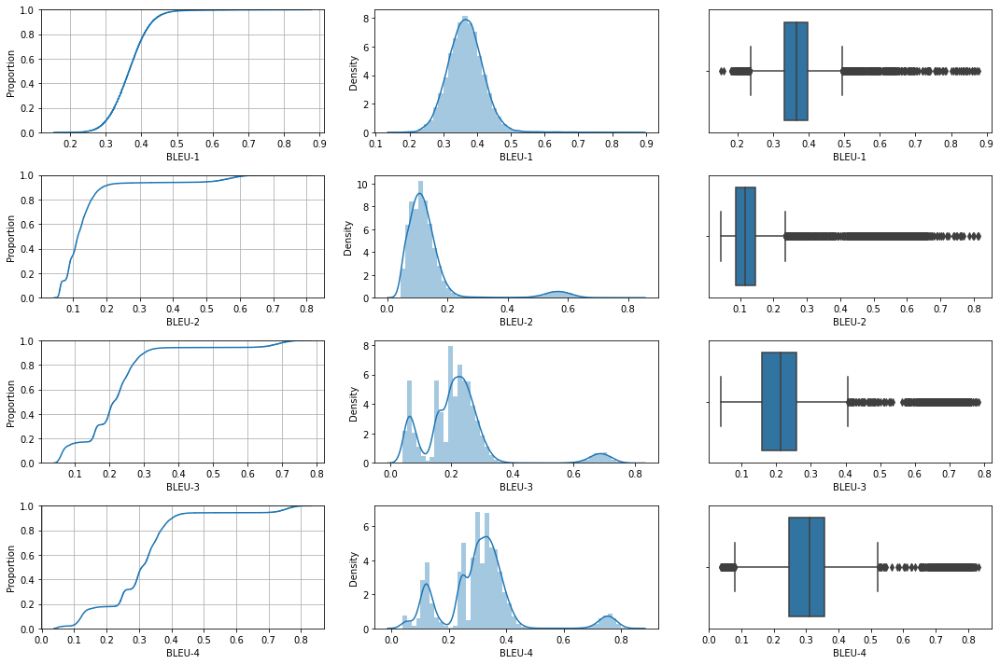

In [ ]:
test = worst_unicode_df[worst_unicode_df.Data_Type=='test']
fig, axs = plt.subplots(4,3, figsize=(15,10))
sns.ecdfplot(test['BLEU-1'], ax=axs[0,0])
axs[0,0].grid()
sns.distplot(test['BLEU-1'], ax=axs[0,1])
sns.boxplot(test['BLEU-1'], ax=axs[0,2])
sns.ecdfplot(test['BLEU-2'], ax=axs[1,0])
axs[1,0].grid()
sns.distplot(test['BLEU-2'], ax=axs[1,1])
sns.boxplot(test['BLEU-2'], ax=axs[1,2])
sns.ecdfplot(test['BLEU-3'], ax=axs[2,0])
axs[2,0].grid()
sns.distplot(test['BLEU-3'], ax=axs[2,1])
sns.boxplot(test['BLEU-3'], ax=axs[2,2])
sns.ecdfplot(test['BLEU-4'], ax=axs[3,0])
axs[3,0].grid()
sns.distplot(test['BLEU-4'], ax=axs[3,1])
sns.boxplot(test['BLEU-4'], ax=axs[3,2])
plt.tight_layout()

In [ ]:
worst_vocab_unicode_vocab_keys = list(worst_unicode_vocab_dict.keys())

worst_unicode_df['common']=[set(x.split()+y.split()) for x, y in tqdm(worst_unicode_df[['Input','Predicted']].values)]
worst_unicode_df['word_preset_in_input']=[set([i for i in y.split() if i in x.split()]) for x, y in tqdm(worst_unicode_df[['Input','Predicted']].values)]
worst_unicode_df['word_not_preset_in_input']=[set([i for i in y.split() if i not in x.split()]) for x, y in tqdm(worst_unicode_df[['Input','Predicted']].values)]


100%|██████████| 37888/37888 [00:15<00:00, 2479.46it/s]


100%|██████████| 37888/37888 [00:00<00:00, 60157.00it/s]


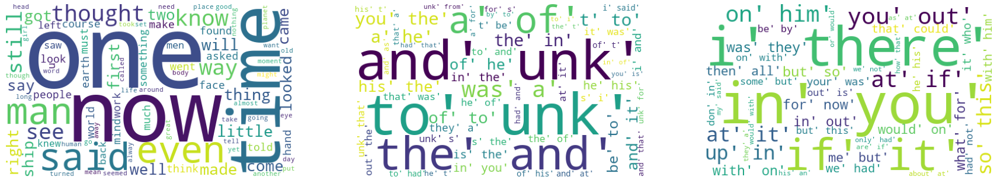

In [ ]:
worst_vocab_unicode_text_word_cloud = word_cloud(worst_data_points) # overall dataset word cloud
test_vocab_unicode_word_preset_in_input_cloud = word_cloud(worst_unicode_df.word_preset_in_input)          # predicted word present in input data word cloud
test_vocab_unicode_word_not_preset_in_input_cloud = word_cloud(worst_unicode_df.word_not_preset_in_input)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(worst_vocab_unicode_text_word_cloud)
axs0.axis("off")
axs1.imshow(test_vocab_unicode_word_preset_in_input_cloud)
axs1.axis("off")
axs2.imshow(test_vocab_unicode_word_not_preset_in_input_cloud)
axs2.axis("off")

plt.show()

100%|██████████| 37888/37888 [00:00<00:00, 49792.40it/s]


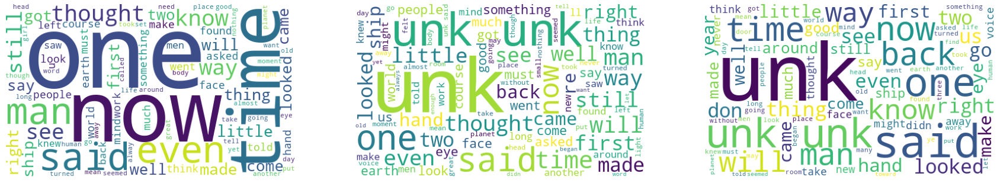

In [ ]:
#worst_vocab_unicode_text_word_cloud = word_cloud(worst_data_points) # overall dataset word cloud
test_vocab_unicode_input_cloud = word_cloud(worst_unicode_df.Input)          # predicted word present in input data word cloud
test_vocab_unicode_predicte_cloud = word_cloud(worst_unicode_df.Predicted)  # predicted word NOT present in input data word cloud

fig, (axs0, axs1, axs2) = plt.subplots(1,3, figsize = (30, 20), facecolor = None)
axs0.imshow(worst_vocab_unicode_text_word_cloud)
axs0.axis("off")
axs1.imshow(test_vocab_unicode_input_cloud)
axs1.axis("off")
axs2.imshow(test_vocab_unicode_predicte_cloud)
axs2.axis("off")

plt.show()

# Conclusion

1. Debugging is the best practice after post training.
2. With small change/tweaks/fixes/changing the processing technique of the input data would lift the model performance.
3. As the model performance depends on the below factors,
- input data size
- vocabulary size
- sequence length
- tokenization
- embedding
- model layers and architecture

And in this case study observed increase in vocab size and complex architecture would lift the performance.


In [3]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Debug Iteration", "Debug Description", "VocabSize", "Epochs", "SeqLen", "BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]
x.add_row(['1', 'Initial tained model', "20K", 10, 80, 0.279140, 0.210808, 0.311747, 0.393518])
x.add_row(['2', 'After fix of string "thritythree" in Vocabulary Creation', "20k", 10, 80, 0.279665, 0.207453, 0.307062, 0.388681])
x.add_row(['3', 'Using UnicodeScriptTokenizer', "20k", 10, 80, 0.368759, 0.142614, 0.221086, 0.305025])
x.add_row(['4', 'Using Top 200k Vocab Words', "200k", 10, 80, 0.346448, 0.145267, 0.226396, 0.309380])
x.add_row(['5', 'Using Sequence Length as 20', "20k", 10, 20, 0.244780, 0.337720, 0.461685, 0.545464])
x.add_row(['6 ', 'Data Split Good-Medium-Worst using BLEU-1 Score', "20k", 10, 80, 0.366834, 0.142819, 0.224909, 0.310138])
print(x)

+-----------------+----------------------------------------------------------+-----------+--------+--------+----------+----------+----------+----------+
| Debug Iteration |                    Debug Description                     | VocabSize | Epochs | SeqLen |  BLEU-1  |  BLEU-2  |  BLEU-3  |  BLEU-4  |
+-----------------+----------------------------------------------------------+-----------+--------+--------+----------+----------+----------+----------+
|        1        |                   Initial tained model                   |    20K    |   10   |   80   | 0.27914  | 0.210808 | 0.311747 | 0.393518 |
|        2        | After fix of string "thritythree" in Vocabulary Creation |    20k    |   10   |   80   | 0.279665 | 0.207453 | 0.307062 | 0.388681 |
|        3        |               Using UnicodeScriptTokenizer               |    20k    |   10   |   80   | 0.368759 | 0.142614 | 0.221086 | 0.305025 |
|        4        |                Using Top 200k Vocab Words                |    